<a href="https://colab.research.google.com/github/hojjatkarami/DeepLearning.ai-Summary/blob/master/SDS2023_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# An Introduction to Neural Networks using Longitudinal Health Data

*Authors: Daniel Meier (Swiss Re Ltd), Michael Mayer (La Mobilière), members of the Data Science Working Group of the Swiss Association of Actuaries, see https://actuarialdatascience.org*.

This notebook introduces how to use neural networks on synthetic, longitudinal health datasets considering risk factors like BMI, blood pressure, age, etc. to predict various health outcomes of individuals over time. The notebook consists of **4 parts**:

1.   Creation of synthetic health datasets
2.   Traditional models: logistic regression/GLM, and Cox regression
3.   Shallow and deep neural networks
4.   Model explainability and risk factor importance

## Key takeaways

*   Currently (in 2023), there is still limited availability of publicly accessible and sufficiently large and dense health datasets, we therefore work on synthetic datasets
*   Traditional models might be the better choice - depending on the (size of the) dataset
*   Neural networks as an extension of GLMs
*   Understanding some basics of epidemiology: hazard rates/ratios, odds ratios, relative risk
*   How to become comfortable with more complex models: partical dependence plots, individual conditional expectations, permutation importance
*   Last but not least: insights into general health aspects 💪


# Part 1: Creation of synthetic health datasets

Importing all packages used throughout the notebook.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
import plotly.graph_objects as go
import statsmodels.formula.api as sm
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Input, Dense, Activation
from sklearn.metrics import auc, roc_auc_score  #, log_loss
from sklearn.model_selection import train_test_split
from sklearn.calibration import calibration_curve
from scipy.special import logit
import random
import sys
if not 'lifelines' in sys.modules:
  %pip install lifelines
import lifelines as ll
if not 'dalex' in sys.modules:
  %pip install dalex
import dalex as dx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


We start by defining **relative risk** (RR) of an individual person with a given vector/tuple of individual attributes ${\bf x}$, e.g., body-mass-index (BMI), systolic blood pressure (SBP), etc.

$$
\mathrm{RR}({\bf x}) = \frac{\mu({\bf x})}{\mu_{\mathrm{ref}}} ,
$$

where $\mu({\bf x})$ is the probability/risk of a health event, e.g., heart attack or mortality, happening over a given fixed **time horizon**, e.g., one year or 10 years. Relative risks require a reference risk $\mu_{\mathrm{ref}}$, usually the assumed probability/risk of a population or individual with reference attributes ${\bf x}$. We use the following attributes as reference and set the time horizon `max_T` to 10 years.


In [ ]:
max_T         = 10
age           = 35
gender        = "male"
height        = 180
weight        = 75   # body-mass-index BMI = weight/height^2 = 23.1kg/m^2
tcl_hdl_ratio = 3.5  # the ratio of total cholesterol level (TCL) to high density lipoprotein (HDL) cholesterol level (the "good" cholesterol), values below 3.5 are considered very good
sbp           = 120  # systolic blood pressure, unit mmHg
sd_sbp        = 10   # the standard deviation of SBP measurements

We initially focus only on BMI and SBP (and age) within these ranges:

In [ ]:
bmi_range = np.arange(18, 40, 0.5)
sbp_range = np.arange(110, 150, 1)
age_range = np.arange(25, 85, 1)

Mainly due to data privacy reasons it remains challenging to get public access to large-scale (longitudinal) health datasets. The following data sources are worthwhile mentioning:

* CPRD, https://cprd.com/data
* MIMIC, https://physionet.org/about/database/
* IPUMS, https://healthsurveys.ipums.org/
* NHANES, https://www.cdc.gov/nchs/nhanes/
* Nightingale, https://docs.nightingalescience.org/
* UK Biobank, https://www.ukbiobank.ac.uk/
* IHME, https://ghdx.healthdata.org/

## QRISK3

As a publicly available starting point to create synthetic datasets, we are using **QRISK3**, see https://qrisk.org/, a risk calculator to estimate the probability of developing a heart attack or stroke over the next 10 years - we will denote this as **CVD risk** (cardio-vascular diseases).

We drop several categorial variables in the calculator, e.g., ethnicity, and just work on age, gender, height, weight, TCL/HDL ratio, SBP, and standard deviation of SBP (the variability from doctor visit-to-visit measurements).

In [ ]:
def qrisk3(age, gender, height, weight, tcl_hdl_ratio, sbp, sd_sbp):
  age = np.maximum(age, 25 - 10*np.tanh((25 - age)/10)) # extension to below age 25
  if gender == "female":
    age_1 = np.power(age/10, -2)
    age_2 = age/10
    bmi   = weight/height/height*10000
    bmi_1 = np.power(bmi/10,-2)
    bmi_2 = np.power(bmi/10,-2)*np.log(bmi/10)

    age_1         = age_1 - 0.053274843841791
    age_2         = age_2 - 4.332503318786621
    bmi_1         = bmi_1 - 0.154946178197861
    bmi_2         = bmi_2 - 0.144462317228317
    tcl_hdl_ratio = tcl_hdl_ratio - 3.476326465606690
    sbp           = sbp - 123.130012512207030
    sd_sbp        = sd_sbp - 9.002537727355957

    # additive parts of effects
    a = age_1 * -8.1388109247726188 + age_2 * 0.79733376689699098 + bmi_1 * 0.29236092275460052 + bmi_2 * -4.1513300213837665 + tcl_hdl_ratio * 0.15338035820802554 + sbp * 0.013131488407103424 + sd_sbp * 0.0078894541014586095

    # interaction parts
    a += age_1 * bmi_1 * 23.802623412141742 + age_1 * bmi_2 * -71.184947692087007 + age_1 * sbp * 0.034131842338615485 + age_2 * bmi_1 * 0.52369958933664429 + age_2 * bmi_2 * 0.045744190122323759 + age_2 * sbp * -0.0015082501423272358

    return 1 - np.power(0.988876402378082, np.exp(a))

  else:
    age_1 = np.power(age/10, -1)
    age_2 = np.power(age/10, 3)
    bmi   = weight/height/height*10000
    bmi_1 = np.power(bmi/10,-2)
    bmi_2 = np.power(bmi/10,-2)*np.log(bmi/10)

    age_1         = age_1 - 0.234766781330109
    age_2         = age_2 - 77.284080505371094
    bmi_1         = bmi_1 - 0.149176135659218
    bmi_2         = bmi_2 - 0.141913309693336
    tcl_hdl_ratio = tcl_hdl_ratio - 4.300998687744141
    sbp           = sbp - 128.571578979492190
    sd_sbp        = sd_sbp - 8.756621360778809

    # additive parts of effects
    a = age_1 * -17.839781666005575 + age_2 * 0.0022964880605765492 + bmi_1 * 2.4562776660536358 + bmi_2 * -8.3011122314711354 + tcl_hdl_ratio * 0.17340196856327111 + sbp * 0.012910126542553305 + sd_sbp * 0.010251914291290456

    # interaction parts
    a += age_1 * bmi_1 * 31.004952956033886 + age_1 * bmi_2 * -111.29157184391643 + age_1 * sbp * 0.018858524469865853 + age_2 * bmi_1 * 0.0050380102356322029 + age_2 * bmi_2 * -0.013074483002524319 + age_2 * sbp * -0.00001271874191588457

    return 1 - np.power(0.977268040180206, np.exp(a))

Set the reference risk $\mu_{\mathrm{ref}}$.

In [ ]:
mu_ref = qrisk3(age, gender, height, weight, tcl_hdl_ratio, sbp, sd_sbp)
print("Reference CVD risk over 10 years: {:.2f}%".format(mu_ref*100))

Reference CVD risk over 10 years: 0.63%


CVD risk - just like mortality - strongly depends on **age**. As a rule of thumb: *10% increase each year.*

For mortality, this rule is known as the *Gompertz-Makeham model/approximation*, but the approximation is only reasonable from around ages 30 to 80.

If we change **only the age** of the reference person, we obtain a plot showing the exponential increase of CVD risk by age.

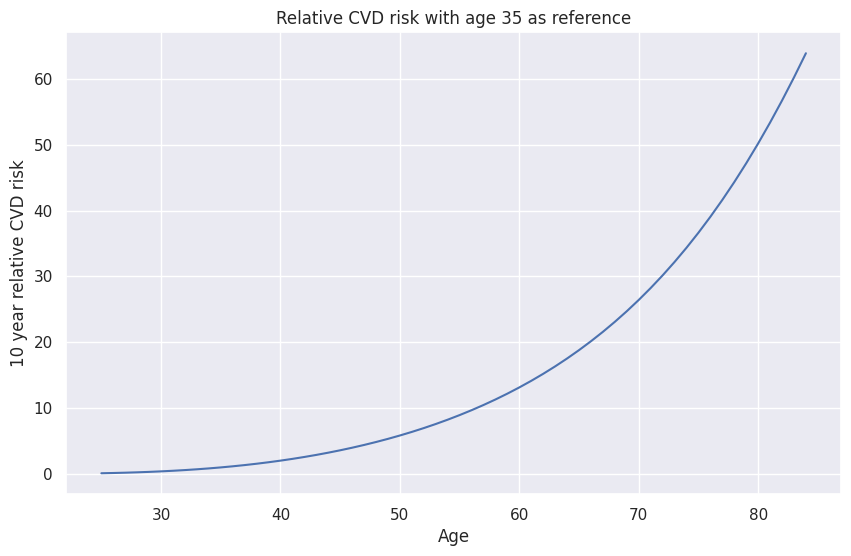

In [ ]:
mu = [qrisk3(x, gender, height, weight, tcl_hdl_ratio, sbp, sd_sbp) for x in age_range]
sn.set()
plt.figure(figsize=(10,6))
plt.plot(age_range, mu/mu_ref)
plt.xlabel('Age')
plt.ylabel('10 year relative CVD risk')
plt.title('Relative CVD risk with age 35 as reference')
plt.show()

CVD risk - just like mortality - depends on **BMI** in a J-shaped way.

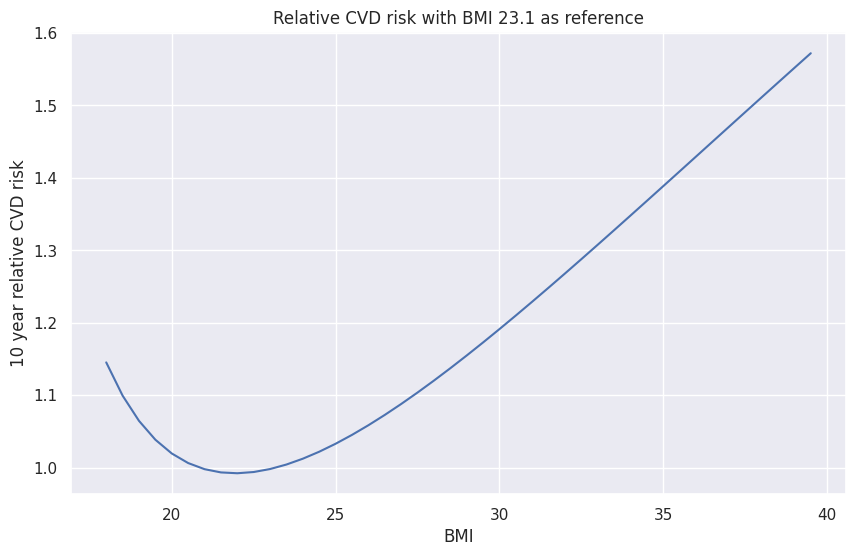

In [ ]:
mu = [qrisk3(age, gender, height, x*(height/100)**2, tcl_hdl_ratio, sbp, sd_sbp) for x in bmi_range]
plt.figure(figsize=(10,6))
plt.plot(bmi_range, mu/mu_ref)
plt.xlabel('BMI')
plt.ylabel('10 year relative CVD risk')
plt.title('Relative CVD risk with BMI 23.1 as reference')
plt.show()

However, if we change **only BMI** this might not be what you are actually interested in, which could be one of the following questions, starting with the one that corresponds to the plot above:

1.   What is the risk of a person with a given BMI and all other attributes equal to the reference person, $\mu(\mathrm{BMI}, \mathrm{SBP}_\mathrm{ref})$?
2.   What is the risk of a person with a given BMI, and SBP set to the conditional expectation of SBP given BMI, $\mu(\mathrm{BMI}, \mathbb{E}[\mathrm{SBP}|\mathrm{BMI}])$?
3.   What is the expected risk of a person with a given BMI, $\mathbb{E}[\mu({\bf x})|\mathrm{BMI}]$?
4.   What is the (causally implied) risk of the reference person when changing BMI, $\mathbb{E}[\mu({\bf x})|do(\mathrm{BMI})]$?

Related literature on health predictions:
*   https://jamanetwork.com/journals/jamanetworkopen/fullarticle/2696872
*   https://www.bmj.com/content/364/bmj.l1042
*   https://www.ahajournals.org/doi/10.1161/hy1001.092966
*   https://journals.plos.org/plosone/article/file?id=10.1371/journal.pone.0214365&type=printable
*   https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9530124/
*   https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0174944
*   https://www.nzz.ch/wissenschaft/abnehmen-8-tipps-wie-man-das-gewicht-dauerhaft-reduziert-ld.1718168


Let's prepare working on questions 2. and 3. by defining

$\begin{pmatrix} \mathrm{SBP} \\ \log(\mathrm{BMI})\end{pmatrix} \sim N\left(
\begin{pmatrix} 125 \\ 3.2\end{pmatrix},
\begin{pmatrix} 15^2 & 15 \cdot 0.25\rho\\ 15 \cdot 0.25 \rho & 0.25^2\end{pmatrix}
\right)$, with a correlation coefficient $\rho = 0.25$.

So, we assume SBP is normally distributed with mean 125mmHg and standard deviation 15mmHg, and BMI is log-normally distributed with mean $\exp(3.2 + 0.25^2/2)\approx 25.3\mathrm{kg}/\mathrm{m}^2$ and standard deviation $\exp(3.2 + 0.25^2/2)\sqrt{\exp(0.25^2)-1}\approx 6.4\mathrm{kg}/\mathrm{m}^2$.

Country     | Mean BMI females  | Mean BMI males
------------|-------------------|----------------
Samoa       |       33.5        |      29.9
USA         |       28.8        |      28.8
UK          |       27.1        |      27.5
Germany     |       25.6        |      27.0
Italy       |       25.2        |      26.8
France      |       24.6        |      26.1
Switzerland |       23.8        |      26.7
Japan       |       21.7        |      23.6

Source: https://en.wikipedia.org/wiki/List_of_sovereign_states_by_body_mass_index


**Period life expectancy at birth in 2019:**

Country     | Life exp. females | Life exp. females
------------|-------------------|----------------
Samoa       |       75.5        |      71.3
USA         |       81.5        |      76.5
UK          |       83.3        |      79.6
Germany     |       83.5        |      78.8
Italy       |       85.4        |      81.1
France      |       85.6        |      79.8
Switzerland |       85.6        |      81.9
Japan       |       87.4        |      81.4

Source (apart from Samoa): https://mortality.org/

Time to simulate the first synthetic dataset $D_1$:

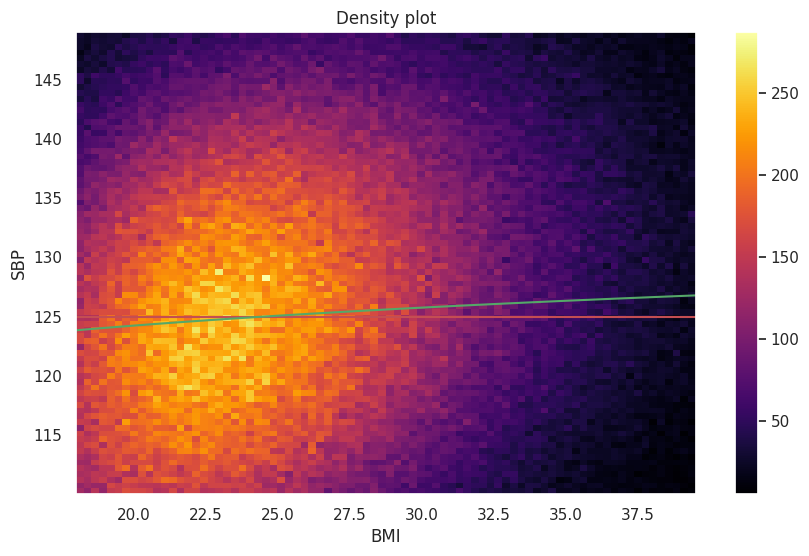

Number of events:        5363
Number of individuals:   688503


,index,BMI,SBP,mu,event,T
0,3,22.286183,110.748826,0.005485,0,NaN
1,4,27.271473,126.547869,0.007587,0,NaN
2,5,34.570903,122.837879,0.008999,0,NaN
3,6,24.091885,113.584311,0.005833,0,NaN
4,7,25.868334,118.341715,0.006495,0,NaN


In [ ]:
persons = 1_000_000
D1 = pd.DataFrame(index = range(persons), columns = ['BMI', 'SBP', 'mu', 'event', 'T'])
np.random.seed(0)
sbp_bmi = np.random.multivariate_normal([125, 3.2], np.matmul(np.matmul(np.diag([15, 0.25]), np.array([[1, 0.25], [0.25, 1]])), np.diag([15, 0.25])), size=persons)
D1.SBP = sbp_bmi[:,0]
D1.BMI = np.exp(sbp_bmi[:,1])
D1.mu = qrisk3(age, gender, height, np.exp(sbp_bmi[:,1])*(height/100)**2, tcl_hdl_ratio, sbp_bmi[:,0], sd_sbp)
D1.event = np.where(np.random.uniform(0, 1, persons) < D1.mu, 1, 0)
D1 = D1[(D1.SBP>=min(sbp_range)) & (D1.SBP<=max(sbp_range)) & (D1.BMI>=min(bmi_range)) & (D1.BMI<=max(bmi_range))].reset_index()

plt.figure(figsize=(10,6))
plt.hist2d(D1.BMI, D1.SBP, bins=(80, 80), cmap=plt.cm.inferno)
plt.plot([bmi_range[0], bmi_range[len(bmi_range)-1]], [125, 125], 'r')
plt.plot(bmi_range, (np.log(bmi_range)-3.2)*0.25*15+125, 'g')
plt.xlabel('BMI')
plt.ylabel('SBP')
plt.title('Density plot')
plt.colorbar()
plt.show()

print("Number of events:       ", np.sum(D1.event))
print("Number of individuals:  ", len(D1))
D1.head()

Coming back to the first 3 questions:

1.   What is the risk of a person with a given BMI and a fixed SBP = 125mmHg, $\mu(\mathrm{BMI}, 125)$?
2.   What is the risk of a person with a given BMI, and SBP set to the conditional expectation of SBP given BMI, $\mu(\mathrm{BMI}, \mathbb{E}[\mathrm{SBP}|\mathrm{BMI}])$?
3.   What is the expected risk of a person with a given BMI, $\mathbb{E}[\mu({\bf x})|\mathrm{BMI}]$?

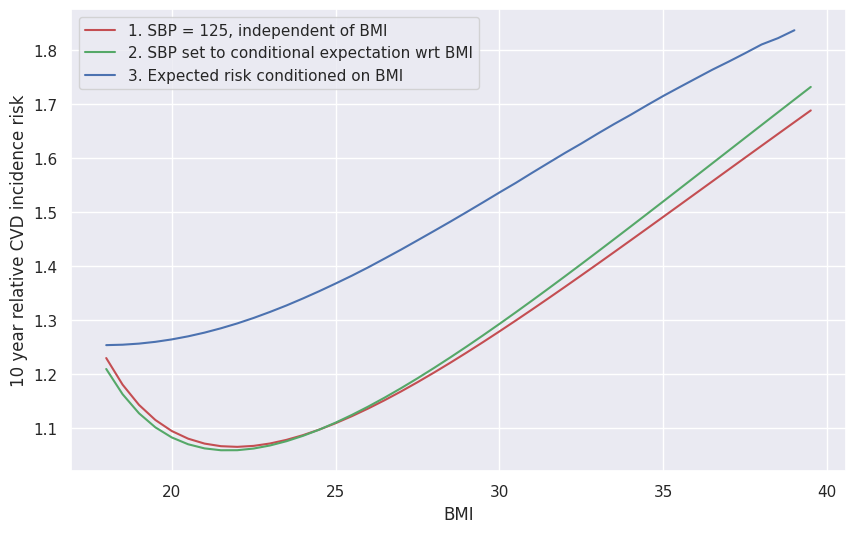

In [ ]:
mu_marginal = [qrisk3(age, gender, height, x*(height/100)**2, tcl_hdl_ratio, 125, sd_sbp) for x in bmi_range]
mu_conditional = [qrisk3(age, gender, height, x*(height/100)**2, tcl_hdl_ratio, (np.log(x)-3.2)*0.25*15+125, sd_sbp) for x in bmi_range]
expected_mu = np.zeros(len(bmi_range)-1)
for j in np.arange(0, len(bmi_range) - 1):
  expected_mu[j] = np.mean(D1.mu[(D1.BMI >= bmi_range[j]) & (D1.mu < bmi_range[j+1])])

plt.figure(figsize=(10,6))
plt.plot(bmi_range, mu_marginal/mu_ref, 'r', bmi_range, mu_conditional/mu_ref, 'g', bmi_range[0:len(bmi_range)-1], expected_mu/mu_ref, 'b')
plt.xlabel('BMI')
plt.ylabel('10 year relative CVD incidence risk')
plt.legend(["1. SBP = 125, independent of BMI", "2. SBP set to conditional expectation wrt BMI", "3. Expected risk conditioned on BMI"])
plt.show()

**Question**: why is the blue curve so different? Let's add a dimension to see... Swiss people are trained to think in 3D 🏔

In [ ]:
mx, my = np.meshgrid(sbp_range, bmi_range)
mu = qrisk3(age, gender, height, my*(height/100)**2, tcl_hdl_ratio, mx, sd_sbp)
fig = go.Figure(data=[go.Surface(z=mu/mu_ref, x=sbp_range, y=bmi_range)])
fig.update_traces(contours_z=dict(show=True, project_z=True), colorscale='Jet')
fig.update_layout(autosize=True, scene = dict(xaxis_title='SBP', yaxis_title='BMI', zaxis_title='Ground truth 10 year relative CVD incidence risk'), width=1000, height=1000)
fig.show()

**Answer**: due to the convexity along SBP (and also due to trimming SBP into plausible ranges in $D_1$).

Thinking about epidemiology in terms of
*   multi-variate distributions or **prevalences** of underlying individual attributes, and
*   (non-linear, non-additive) multi-variate **response functions** from individual attributes to health risks

can be very useful 👍

# Part 2: Traditional models: logistic regression/GLM, and Cox regression

For all models, we will work on min-max scaled covariates and assess 3 performance metrics (ROC AUC, MSE with respect to log ground truth, logistic deviance) on unseen test data taken from $D_1$.

In [ ]:
D1["BMI_scaled"] = (D1.BMI-min(bmi_range))/(max(bmi_range)-min(bmi_range))
D1["SBP_scaled"] = (D1.SBP-min(sbp_range))/(max(sbp_range)-min(sbp_range))
D1_train, D1_test = train_test_split(D1, test_size = 0.15, random_state = 0)

## Logistic regression/GLM on $D_1$

We use the statsmodels package to run a logistic regression/GLM (generalized linear model) on the train subset of $D_1$.

The functional form is given by

$$
\mathrm{logit}(\mu_{\text{log reg}}({\bf x})) = \beta_0 + \beta_1\mathrm{SBP\_scaled}+ \beta_2\mathrm{BMI\_scaled} + \beta_3\mathrm{BMI\_scaled}^2~,
$$

where $\mathrm{logit}(x) := \log(x/(1-x))$ is called the *link function* of the GLM.

We define $y_j:=\mathrm{event}_j$, where $y_j = 1$ means that the $j$-th event in the train subset of $D_1$ happens, and $\widehat{y}_j = \mu_{\text{log reg}}({\bf x}_j)$. The (total) deviance function that gets minimized during the fitting of the logistic regression (equivalent to maximizing log-likelihood) is given by

$$
D(y, {\widehat{y}}) = -2\sum_{j=1}^{|D_{1,\mathrm{train}}|} y_j\log(\widehat{y}_j)+(1-y_j)\log(1-\widehat{y}_j)~.
$$

It is proportional to the binary cross-entropy and the log loss.

Optimization terminated successfully.
         Current function value: 0.045549
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                  event   No. Observations:               585227
Model:                          Logit   Df Residuals:                   585223
Method:                           MLE   Df Model:                            3
Date:                Wed, 21 Jun 2023   Pseudo R-squ.:                0.003406
Time:                        17:34:33   Log-Likelihood:                -26656.
converged:                       True   LL-Null:                       -26747.
Covariance Type:            nonrobust   LLR p-value:                 2.941e-39
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             -5.1893      0.051   -102.681      0.000      -5.288      -5.090
SBP_s

ROC AUC (test):            0.5617061723108522
MSE wrt log ground truth:  0.0015757922217920983
Logistic deviance:         9223.880067951093


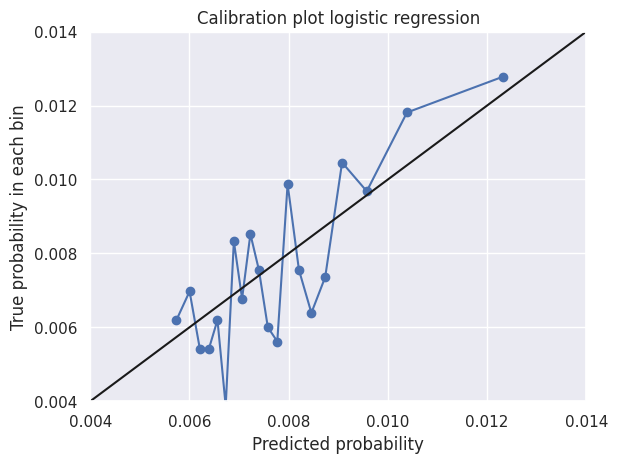

In [ ]:
log_reg_D1 = sm.logit(formula='event ~ SBP_scaled + BMI_scaled + I(BMI_scaled**2)', data=D1_train).fit()
print(log_reg_D1.summary())

mx, my = np.meshgrid((sbp_range-min(sbp_range))/(max(sbp_range)-min(sbp_range)), (bmi_range-min(bmi_range))/(max(bmi_range)-min(bmi_range)))
bmi_sbp = pd.DataFrame({'SBP_scaled': mx.flatten(), 'BMI_scaled': my.flatten()})
pred = log_reg_D1.predict(bmi_sbp).values.reshape(len(bmi_range), len(sbp_range))

fig = go.Figure(data=[go.Surface(z=pred/mu_ref, x=sbp_range, y=bmi_range)])
fig.update_traces(contours_z=dict(show=True, project_z=True), colorscale='Jet')
fig.update_layout(autosize=True, scene = dict(xaxis_title='SBP', yaxis_title='BMI', zaxis_title='Fitted 10 year relative CVD incidence risk'), width=1000, height=1000)
fig.show()

fig = go.Figure(data=[go.Surface(z=mu/mu_ref, x=sbp_range, y=bmi_range)])
fig.update_traces(contours_z=dict(show=True, project_z=True), colorscale='Jet')
fig.update_layout(autosize=True, scene = dict(xaxis_title='SBP', yaxis_title='BMI', zaxis_title='Ground truth 10 year relative CVD incidence risk'), width=1000, height=1000)
fig.show()

pred = log_reg_D1.predict(D1_test)
auc_log_reg_D1 = roc_auc_score(D1_test.event, pred)
mse_log_reg_D1 = np.mean(np.square(np.log(D1_test.mu) - np.log(pred)))
dev_log_reg_D1 = -2*np.sum(D1_test.event*logit(pred) + np.log(1-pred))
print("ROC AUC (test):           ", auc_log_reg_D1)
print("MSE wrt log ground truth: ", mse_log_reg_D1)
print("Logistic deviance:        ", dev_log_reg_D1)

prob_true, prob_pred = calibration_curve(D1_test.event, pred, n_bins=20, strategy='quantile')
plt.figure()
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0.004, 0.014], [0.004, 0.014], 'k')
plt.axis([0.004, 0.014, 0.004, 0.014])
plt.title('Calibration plot logistic regression')
plt.xlabel('Predicted probability')
plt.ylabel('True probability in each bin')
plt.show()

**Conclusions**
* ROC AUC comparatively low - mainly due to low event probabilities (and comparatively low variances across individuals)
* Logistic deviance and MSE lack comparisons to understand performance
* Visually comparing logistic regression vs ground truth looks ok
* Calibration plot looks ok

**Interpretation of model coefficients $\beta_j$**

First, define the **odds** of an event happening given $\bf x$ by

$$
\mathrm{odds}(y = 1 | {\bf x}) = \frac{P(y=1| {\bf x})}{P(y=0| {\bf x})} = \frac{P(y=1| {\bf x})}{1-P(y=1| {\bf x})}~.
$$

The **log odds** under the logistic regression model $\mu_{\text{log reg}}({\bf x})$ then are given by

$$
\log(\mathrm{odds}(y = 1 | {\bf x})) =
\mathrm{logit}(\mathrm{P}(y = 1 | {\bf x})) =
\mathrm{logit}(\mu_{\text{log reg}}({\bf x})) =
\beta_0 + \beta_1\mathrm{SBP\_scaled}+ \beta_2\mathrm{BMI\_scaled} + \beta_3\mathrm{BMI\_scaled}^2~.
$$

Increasing an $x_j$ by 1 compared to $\bf x$ leads to the following **odds ratio** (OR)

$$
\frac{\mathrm{odds}(y=1|\text{increase $x_j$ by 1 compared to $\bf x$})}{\mathrm{odds}(y=1| {\bf x})} = \exp(\beta_j)~.
$$

## Cox regression on $D_1$

We use the lifelines package to run a Cox regression/Cox proportional hazards model on the train subset of $D_1$.

Cox regression is a *semi-parametric* model with one part being a **baseline hazard rate** $h_0(t)$ depending only on time $t$, but not on $\bf x$, and a time-independent part, but depending on $\bf x$. The full functional form of the hazard rate is given by

$$
h(t | {\bf x}) = h_0(t)\exp\left(\beta_1\mathrm{SBP\_scaled}+ \beta_2\mathrm{BMI\_scaled} + \beta_3\mathrm{BMI\_scaled}^2\right)~.
$$

**What is a hazard rate?**

We defined the probability of a CVD event happening over a time horizon of 10 years by $\mu({\bf x})$. A hazard rate is an instantaneous, time-continuous version of this and is comparable to a *continuous compound interest rate* to evaluate zero-coupon bonds. In general, hazard rates are defined by

$$
h(t) := \lim_{\tau\to 0}\frac{P(t\leq T < t+\tau)}{\tau P(T\geq t)}~.
$$

**Interpretation of model coefficients $\beta_j$**

For logistic regression we could interpret the model coefficients via odds ratios (ORs). For Cox regression, the model coefficients can be interpreted by **hazard ratios** (HRs). Increasing an $x_j$ by 1 compared to $\bf x$ leads to a hazard ratio of

$$
\frac{h(t|\text{increase $x_j$ by 1 compared to $\bf x$})}{h(t|{\bf x})} = \exp(\beta_j)~.
$$

Note that the hazard ratio is constant over time $t$, which is the reason why Cox regression is called a *proportioanal* hazard model.

The **survival probability** (i.e., the event is not happening until time $t$) is given by

$$
S(t|{\bf x}) = \exp\left(-\int_{\tau = 0}^t h(t|{\bf x})\ d\tau\right)~,
$$

and we obtain the probability of an event happening by

$$
\mu_{\text{Cox}}({\bf x}) = 1 - S(10|{\bf x})~,
$$

which we can compare against logistic regression $\mu_{\text{log reg}}({\bf x})$.

While logistic regression only considered the binary event variable as target, Cox regression also makes use of the **time to event**, which provides additional information. Cox regression is essentially fitting the survival curves $S(t|{\bf x})$ that contain more information than the binary event variable. We thus need to add the time to event to our dataset $D_1$.

We define a function `draw_T` that draws a time of the event conditioned that the event happens over the 10 year time horizon. We use the *Gompertz-Makeham assumption* that risk increases by 10% annually, which corresponds to an instantaneous, time-continuous rate of around 0.095, i.e., $\exp(0.095)\approx 1.1$. Overall, the CDF $F(t)$ from which `draw_T` draws is given by

$$
F(t) := \mu({\bf x})^{-1}\left(1-\exp\left(-\int_{\tau = 0}^{t} \alpha\exp(0.0095\tau)\ d\tau \right)\right)~,
$$

where $\alpha$ is chosen such that

$$
1-\exp\left(-\int_{\tau = 0}^{t} \alpha\exp(0.0095\tau)\ d\tau \right) = \mu({\bf x})~.
$$

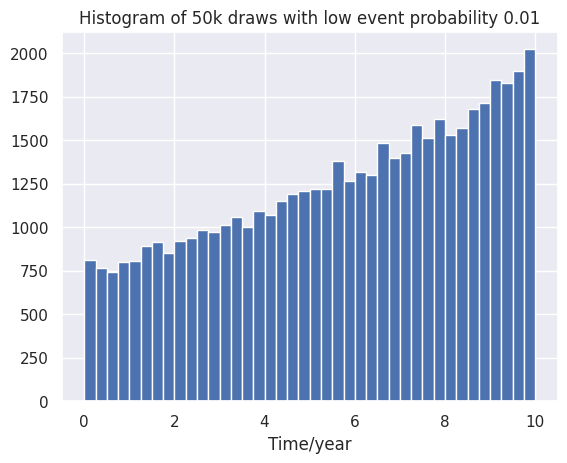

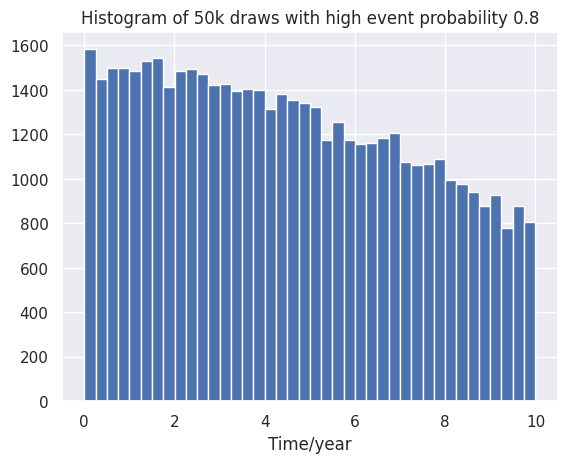

In [ ]:
def draw_T(mu):
  beta = 0.095 # assuming increase of risk of around 10% per year
  # bisection approach to obtain alpha
  alpha_lb = 0
  alpha_ub = 1
  while (alpha_ub - alpha_lb > 0.000005):
    if np.exp((alpha_ub + alpha_lb)/2*(1-np.exp(max_T*beta))/beta) > 1 - mu:
      alpha_lb = (alpha_ub + alpha_lb)/2
    else:
      alpha_ub = (alpha_ub + alpha_lb)/2
  alpha = (alpha_ub + alpha_lb)/2
  t_lb = 0
  t_ub = max_T
  r = np.random.uniform(0, 1)
  # inversion of 1 - survival curve by bisection
  while (t_ub - t_lb > 0.01):
    if (1 - np.exp(alpha*(1 - np.exp((t_ub + t_lb)/2*beta))/beta))/mu < r:
      t_lb = (t_ub + t_lb)/2
    else:
      t_ub = (t_ub + t_lb)/2
  return (t_ub + t_lb)/2

plt.hist([draw_T(0.01) for x in range(50000)] , bins=40)
plt.title("Histogram of 50k draws with low event probability 0.01")
plt.xlabel("Time/year")
plt.show()
plt.hist([draw_T(0.8) for x in range(50000)] , bins=40)
plt.title("Histogram of 50k draws with high event probability 0.8")
plt.xlabel("Time/year")
plt.show()

Apply `draw_T` to $D_{1, \mathrm{train}}$ and $D_{1, \mathrm{test}}$:

In [ ]:
np.random.seed(0)
D1_train["T"] = D1_train.apply(lambda row : max_T if row.event == 0 else draw_T(row.mu), axis=1)
D1_test["T"] = D1_test.apply(lambda row : max_T if row.event == 0 else draw_T(row.mu), axis=1)
print("Number of person years: ", int(np.sum(D1_train["T"]) + np.sum(D1_test["T"])))

Number of person years:  6862185


Ready for Cox regression... but let's first look at the estimated overall survival curve, using the **Kaplan-Meier** estimator:

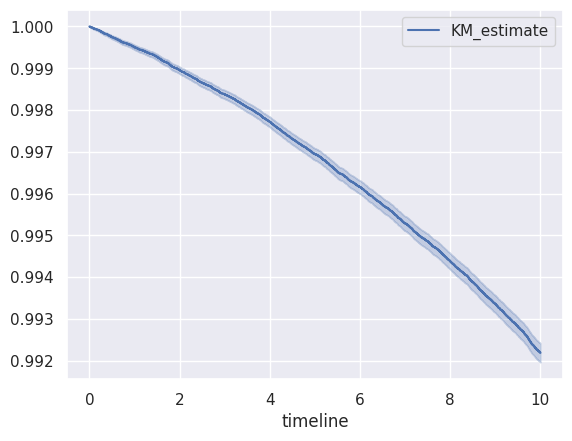

In [ ]:
kmf = ll.KaplanMeierFitter()
kmf.fit(D1_train['T'], event_observed=D1_train['event'])
kmf.plot_survival_function();

Finally, **Cox regression**:

<lifelines.CoxPHFitter: fitted with 585227 total observations, 580653 right-censored observations>
             duration col = 'T'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 585227
number of events observed = 4574
   partial log-likelihood = -60632.64
         time fit was run = 2023-06-21 17:34:53 UTC

---
                   coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                
SBP_scaled         0.49       1.63       0.06             0.38             0.60                 1.46                 1.83
BMI_scaled        -0.09       0.91       0.22            -0.52             0.34                 0.60                 1.40
I(BMI_scaled**2)   0.71       2.04       0.23             0.26             1.16                 1.30                 3.19

                   cmp to     z      p   -log2(p)
covariate                                        
SBP_scaled           0.00  8.42 <0.005      54.56
BMI_scaled           0.00 -0.42   0.68       0.57
I(BMI_scaled**2)     0.00  3.12 <0.005       9.11
---
Concordance = 0.56
Partial AIC = 121271.27
log-likelihood ratio test = 182.09 on 3 df
-log2(p) of ll-ratio test = 127.92

ROC AUC (test):            0.561706568045608
MSE wrt log ground truth:  0.0015788497360106327
Logistic deviance:         9223.87818207559


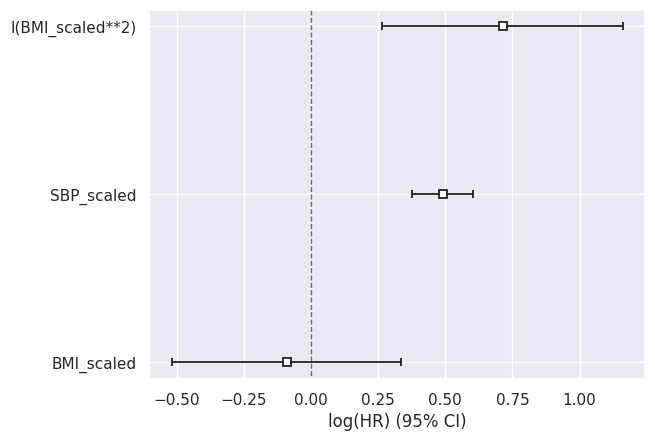

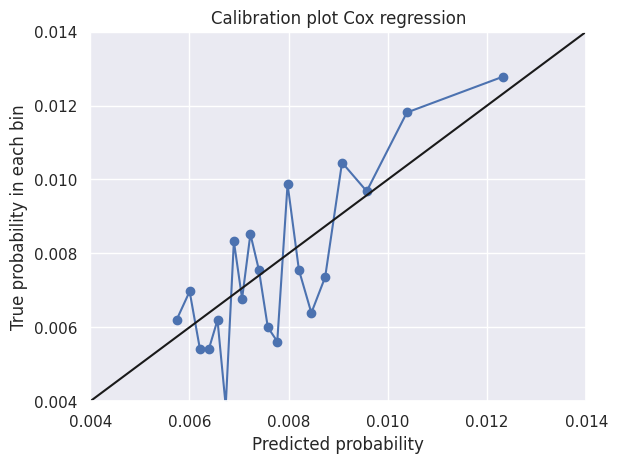

In [ ]:
cph_D1 = ll.CoxPHFitter()
cph_D1.fit(D1_train, 'T', event_col='event', formula="SBP_scaled + BMI_scaled + I(BMI_scaled**2)")
cph_D1.print_summary()
cph_D1.plot();

survival = cph_D1.predict_survival_function(D1_test)
pred = 1 - np.squeeze(np.array(survival.iloc[-1,:]))
auc_cox_reg_D1 = roc_auc_score(D1_test.event, pred)
mse_cox_reg_D1 = np.mean(np.square(np.log(D1_test.mu) - np.log(pred)))
dev_cox_reg_D1 = -2*np.sum(D1_test.event*logit(pred) + np.log(1-pred))
print("ROC AUC (test):           ", auc_cox_reg_D1)
print("MSE wrt log ground truth: ", mse_cox_reg_D1)
print("Logistic deviance:        ", dev_cox_reg_D1)

prob_true, prob_pred = calibration_curve(D1_test.event, pred, n_bins=20, strategy='quantile')
plt.figure()
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0.004, 0.014], [0.004, 0.014], 'k')
plt.axis([0.004, 0.014, 0.004, 0.014])
plt.title('Calibration plot Cox regression')
plt.xlabel('Predicted probability')
plt.ylabel('True probability in each bin')
plt.show()

mx, my = np.meshgrid((sbp_range-min(sbp_range))/(max(sbp_range)-min(sbp_range)), (bmi_range-min(bmi_range))/(max(bmi_range)-min(bmi_range)))
bmi_sbp = pd.DataFrame({'SBP_scaled': mx.flatten(), 'BMI_scaled': my.flatten()})
pred = (1 - np.array(cph_D1.predict_survival_function(bmi_sbp))[-1,:]).reshape(len(bmi_range), len(sbp_range))

fig = go.Figure(data=[go.Surface(z=pred/mu_ref, x=sbp_range, y=bmi_range)])
fig.update_traces(contours_z=dict(show=True, project_z=True), colorscale='Jet')
fig.update_layout(autosize=True, scene = dict(xaxis_title='SBP', yaxis_title='BMI', zaxis_title='Fitted 10 year relative CVD incidence risk'), width=1000, height=1000)
fig.show()

Survival curves stratified by (scaled) SBP:

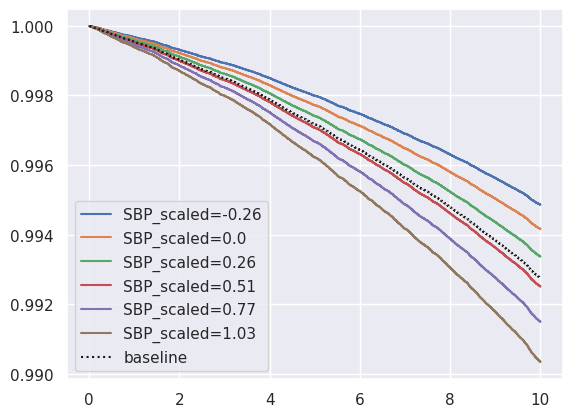

In [ ]:
cph_D1.plot_partial_effects_on_outcome(covariates='SBP_scaled', values=np.round((np.array([100, 110, 120, 130, 140, 150])-np.min(sbp_range))/(np.max(sbp_range)-np.min(sbp_range)), 2));

Model performances on $D_{1, \mathrm{test}}$ overview. No substantial improvement of Cox regression over logistic regression so far.

In [ ]:
print("Logistic regression")
print("===================")
print("ROC AUC (test):           ", auc_log_reg_D1)
print("MSE wrt log ground truth: ", mse_log_reg_D1)
print("Logistic deviance:        ", dev_log_reg_D1)


print("\nCox regression")
print("==============")
print("ROC AUC (test):           ", auc_cox_reg_D1)
print("MSE wrt log ground truth: ", mse_cox_reg_D1)
print("Logistic deviance:        ", dev_cox_reg_D1)

Logistic regression
ROC AUC (test):            0.5617061723108522
MSE wrt log ground truth:  0.0015757922217920983
Logistic deviance:         9223.880067951093

Cox regression
ROC AUC (test):            0.561706568045608
MSE wrt log ground truth:  0.0015788497360106327
Logistic deviance:         9223.87818207559


# Part 3: Shallow and deep neural networks

First, we show the analogy between neural nets and GLMs by defining a *shall neural net* without any hidden layers. We have to add the `I(BMI_scaled**2)` of the formula used for logistic regression to the data.

In [ ]:
D1_train['BMI_scaled_squared'] = D1_train.BMI_scaled**2
D1_test['BMI_scaled_squared'] = D1_test.BMI_scaled**2

## Neural network on $D_1$

We use the keras package integrated into tensorflow.

In [ ]:
shallow_neural_net_D1 = Sequential([
  Input(shape=(3,)),
  Dense(1, activation = "sigmoid", kernel_initializer=tf.keras.initializers.glorot_uniform(seed=0))
])

The functional form of this neural net is given by

$$
\mathrm{logit}(\mu_{\text{shallow neural net}}({\bf x})) = \beta_0 + \beta_1\mathrm{SBP\_scaled}+ \beta_2\mathrm{BMI\_scaled} + \beta_3\mathrm{BMI\_scaled}^2~,
$$

and the loss function that gets minimized by **binary cross entropy** is

$$
D(y, {\widehat{y}}) = -2\sum_{j=1}^{|D_{1,\mathrm{train}}|} y_j\log(\widehat{y}_j)+(1-y_j)\log(1-\widehat{y}_j)~.
$$

Looks familiar - exactly the same as for logistic regression. However, while logistic regression essentially finds the exact solution (or one of the exact solutions) by *iteratively reweighted least squares*, the neural net
 is designed in a much more general way with much slower convergence - if at all - to the global minimum. We will see later in the more complex dataset $D_2$ that one usually spends many trainable parameters and then applies **early stopping** methods when the model starts to overfit the training data.

Fitting/training the shallow neural net:

Epoch 1/10
1829/1829 [==============================] - 5s 2ms/step - loss: 0.1911 - val_loss: 0.0690
Epoch 2/10
1829/1829 [==============================] - 4s 2ms/step - loss: 0.0589 - val_loss: 0.0506
Epoch 3/10
1829/1829 [==============================] - 4s 2ms/step - loss: 0.0515 - val_loss: 0.0478
Epoch 4/10
1829/1829 [==============================] - 5s 3ms/step - loss: 0.0495 - val_loss: 0.0460
Epoch 5/10
1829/1829 [==============================] - 4s 2ms/step - loss: 0.0478 - val_loss: 0.0446
Epoch 6/10
1829/1829 [==============================] - 3s 2ms/step - loss: 0.0468 - val_loss: 0.0440
Epoch 7/10
1829/1829 [==============================] - 5s 3ms/step - loss: 0.0464 - val_loss: 0.0437
Epoch 8/10
1829/1829 [==============================] - 3s 2ms/step - loss: 0.0462 - val_loss: 0.0436
Epoch 9/10
1829/1829 [==============================] - 4s 2ms/step - loss: 0.0461 - val_loss: 0.0436
Epoch 10/10
1829/1829 [==============================] - 4s 2ms/step - loss: 0.046

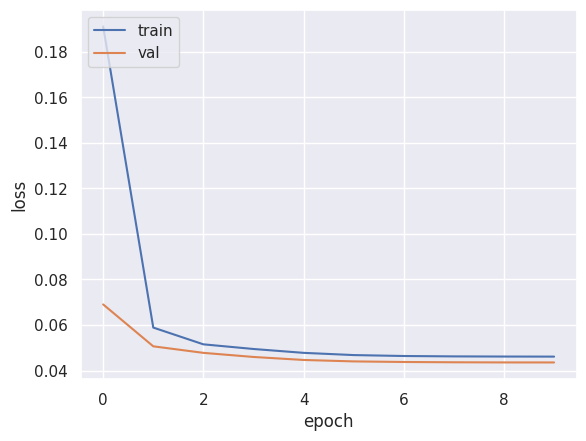

In [ ]:
X_train = D1_train[['SBP_scaled', 'BMI_scaled', 'BMI_scaled_squared']]
y_train = D1_train['event']
shallow_neural_net_D1.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.002), loss = 'binary_crossentropy')
history = shallow_neural_net_D1.fit(X_train, y_train, batch_size = 256, epochs = 10, shuffle = True, validation_split = 0.2, verbose = 1)

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Inspecting the coefficients/weights of the shallow neural net and comparing them to the coefficients of logistic regression:

In [ ]:
print("Shallow neural net intercept:     ", shallow_neural_net_D1.layers[0].get_weights()[1])
print("Shallow neural net model weights: ", shallow_neural_net_D1.layers[0].get_weights()[0])
print("Logistic regression coefficients: ")
print(log_reg_D1.params)

Shallow neural net intercept:      [-4.93252]
Shallow neural net model weights:  [[ 0.24638198]
 [-0.66163653]
 [ 1.351417  ]]
Logistic regression coefficients: 
Intercept            -5.189281
SBP_scaled            0.492821
BMI_scaled           -0.093293
I(BMI_scaled ** 2)    0.718205
dtype: float64


Model performances on $D_{1, \mathrm{test}}$ overview.

In [ ]:
X_test = D1_test[['SBP_scaled', 'BMI_scaled', 'BMI_scaled_squared']]
y_test = D1_test['event']
pred = shallow_neural_net_D1.predict(X_test).flatten()

auc_shallow_neural_net_D1 = roc_auc_score(D1_test.event, pred)
mse_shallow_neural_net_D1 = np.mean(np.square(np.log(D1_test.mu) - np.log(pred)))
dev_shallow_neural_net_D1 = -2*np.sum(D1_test.event*logit(pred) + np.log(1-pred))

print("Logistic regression")
print("===================")
print("ROC AUC (test):           ", auc_log_reg_D1)
print("MSE wrt log ground truth: ", mse_log_reg_D1)
print("Logistic deviance:        ", dev_log_reg_D1)

print("\nCox regression")
print("==============")
print("ROC AUC (test):           ", auc_cox_reg_D1)
print("MSE wrt log ground truth: ", mse_cox_reg_D1)
print("Logistic deviance:        ", dev_cox_reg_D1)

print("\nShallow neural net")
print("==================")
print("ROC AUC (test):           ", auc_shallow_neural_net_D1)
print("MSE wrt log ground truth: ", mse_shallow_neural_net_D1)
print("Logistic deviance:        ", dev_shallow_neural_net_D1)

3228/3228 [==============================] - 4s 1ms/step
Logistic regression
ROC AUC (test):            0.5617061723108522
MSE wrt log ground truth:  0.0015757922217920983
Logistic deviance:         9223.880067951093

Cox regression
ROC AUC (test):            0.561706568045608
MSE wrt log ground truth:  0.0015788497360106327
Logistic deviance:         9223.87818207559

Shallow neural net
ROC AUC (test):            0.5588473349669512
MSE wrt log ground truth:  0.010480729447106716
Logistic deviance:         9234.59640272893


The shallow neural does not outperform the traditional models in any of the performance metrics.

Let's create a more complex, deeper neural net with 2 hidden layers:

In [ ]:
deep_neural_net_D1 = Sequential([
  Input(shape=(2,)),
  Dense(256, kernel_initializer=tf.keras.initializers.glorot_uniform(seed=0)),
  Activation(tf.keras.activations.relu),
  Dense(16, kernel_initializer=tf.keras.initializers.glorot_uniform(seed=0)),
  Activation(tf.keras.activations.relu),
  Dense(1, activation = "sigmoid", kernel_initializer=tf.keras.initializers.glorot_uniform(seed=0))
])
print(deep_neural_net_D1.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 256)               768       
                                                                 
 activation (Activation)     (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 16)                4112      
                                                                 
 activation_1 (Activation)   (None, 16)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 17        
                                                                 
Total params: 4,897
Trainable params: 4,897
Non-trainable params: 0
_________________________________________________________________
None


**How does the functional form of the neural net look like?**

Input layer: (scaled) SBP and (scaled) BMI.

Each of the 256 **neurons** in the next layer, the first hidden layer, takes SBP and BMI as input and calculates $z_j^{(1)}$

$$
z_j^{(1)} = \phi^{(1)}\left(
\beta_{0,j}^{(1)} + \beta_{1,j}^{(1)}\mathrm{SBP\_scaled}+ \beta_{2,j}^{(1)}\mathrm{BMI\_scaled}\right)~\text{, for $1\leq j\leq 256$,}
$$

where $\phi^{(1)}(x) = \mathrm{ReLU}(x) = x\cdot 1_{x\geq 0}$.

Each of the 16 neurons in the next hidden layer, takes the 256 outputs $z_j^{(1)}$ of the previous layers as input and calculates $z_j^{(2)}$

$$
z_j^{(2)} = \phi^{(2)}\left(
\beta_{0,j}^{(2)} + \beta_{1,j}^{(2)}z_1^{(1)}+ \cdots +\beta_{256,j}^{(2)}z_{256}^{(1)}\right)~\text{, for $1\leq j\leq 16$,}
$$

where also $\phi^{(2)} = \mathrm{ReLU}$.

Finally, the last layer calculates the output

$$
\mu_{\text{deep neural net}}({\bf x}) = \phi^{(3)}\left(
\beta_{0,1}^{(3)} + \beta_{1,1}^{(3)}z_1^{(2)}+ \cdots +\beta_{16,1}^{(3)}z_{16}^{(2)}\right)~,
$$

where $\phi^{(3)}(x) =  \mathrm{logit}^{-1}(x) = 1/(1+\exp(-x))$.

The number of parameters/coefficients/weights is $256+2\cdot 256=768$ in the first hidden layer, $16+256\cdot 16 = 4112$ in the second hidden layer and $17$ parameters in the last layer, **4897 parameters** in total.


Epoch 1/20
1829/1829 [==============================] - 7s 3ms/step - loss: 0.0494 - val_loss: 0.0438
Epoch 2/20
1829/1829 [==============================] - 5s 3ms/step - loss: 0.0465 - val_loss: 0.0436
Epoch 3/20
1829/1829 [==============================] - 6s 3ms/step - loss: 0.0465 - val_loss: 0.0438
Epoch 4/20
1829/1829 [==============================] - 5s 3ms/step - loss: 0.0464 - val_loss: 0.0435
Epoch 5/20
1829/1829 [==============================] - 6s 3ms/step - loss: 0.0463 - val_loss: 0.0441
Epoch 6/20
1829/1829 [==============================] - 5s 3ms/step - loss: 0.0463 - val_loss: 0.0435
Epoch 7/20
1829/1829 [==============================] - 6s 3ms/step - loss: 0.0463 - val_loss: 0.0436
Epoch 8/20
1829/1829 [==============================] - 5s 3ms/step - loss: 0.0463 - val_loss: 0.0436
Epoch 9/20
1829/1829 [==============================] - 6s 3ms/step - loss: 0.0462 - val_loss: 0.0435
Epoch 10/20
1829/1829 [==============================] - 5s 3ms/step - loss: 0.046

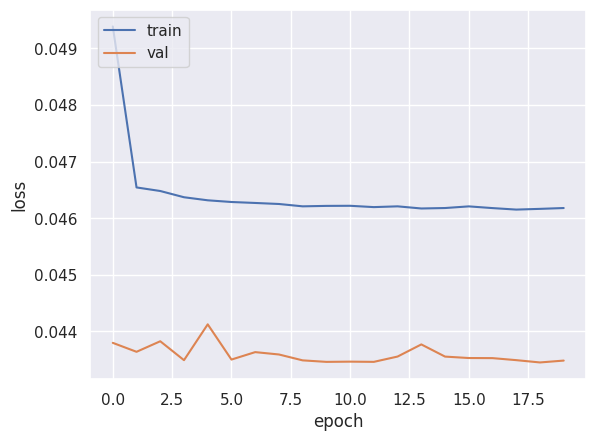

In [ ]:
X_train = D1_train[['SBP_scaled', 'BMI_scaled']]
y_train = D1_train['event']
tf.random.set_seed(0)
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(0.005, decay_steps=1000, decay_rate=0.99)
opt = tf.keras.optimizers.Adam(learning_rate = lr_schedule)
deep_neural_net_D1.compile(optimizer = opt, loss = 'binary_crossentropy')
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience = 10, restore_best_weights=True)
history = deep_neural_net_D1.fit(X_train, y_train, batch_size = 256, epochs = 20, shuffle = True, validation_split = 0.20, verbose = 1, callbacks=[callback])

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

3228/3228 [==============================] - 5s 1ms/step
Logistic regression
ROC AUC (test):            0.5617061723108522
MSE wrt log ground truth:  0.0015757922217920983
Logistic deviance:         9223.880067951093

Cox regression
ROC AUC (test):            0.561706568045608
MSE wrt log ground truth:  0.0015788497360106327
Logistic deviance:         9223.87818207559

Shallow neural net
ROC AUC (test):            0.5588473349669512
MSE wrt log ground truth:  0.010480729447106716
Logistic deviance:         9234.59640272893

Deep neural net
ROC AUC (test):            0.5604296185551024
MSE wrt log ground truth:  0.005701733303625341
Logistic deviance:         9227.724153258838


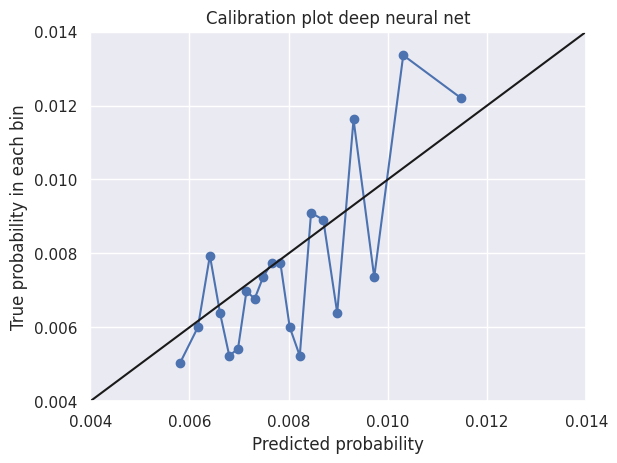

55/55 [==============================] - 0s 2ms/step


In [ ]:
X_test = D1_test[['SBP_scaled', 'BMI_scaled']]
y_test = D1_test['event']
pred = deep_neural_net_D1.predict(X_test).flatten()

auc_deep_neural_net_D1 = roc_auc_score(D1_test.event, pred)
mse_deep_neural_net_D1 = np.mean(np.square(np.log(D1_test.mu) - np.log(pred)))
dev_deep_neural_net_D1 = -2*np.sum(D1_test.event*logit(pred) + np.log(1-pred))

print("Logistic regression")
print("===================")
print("ROC AUC (test):           ", auc_log_reg_D1)
print("MSE wrt log ground truth: ", mse_log_reg_D1)
print("Logistic deviance:        ", dev_log_reg_D1)

print("\nCox regression")
print("==============")
print("ROC AUC (test):           ", auc_cox_reg_D1)
print("MSE wrt log ground truth: ", mse_cox_reg_D1)
print("Logistic deviance:        ", dev_cox_reg_D1)

print("\nShallow neural net")
print("==================")
print("ROC AUC (test):           ", auc_shallow_neural_net_D1)
print("MSE wrt log ground truth: ", mse_shallow_neural_net_D1)
print("Logistic deviance:        ", dev_shallow_neural_net_D1)

print("\nDeep neural net")
print("==================")
print("ROC AUC (test):           ", auc_deep_neural_net_D1)
print("MSE wrt log ground truth: ", mse_deep_neural_net_D1)
print("Logistic deviance:        ", dev_deep_neural_net_D1)

prob_true, prob_pred = calibration_curve(D1_test.event, pred, n_bins=20, strategy='quantile')
plt.figure()
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0.004, 0.014], [0.004, 0.014], 'k')
plt.axis([0.004, 0.014, 0.004, 0.014])
plt.title('Calibration plot deep neural net')
plt.xlabel('Predicted probability')
plt.ylabel('True probability in each bin')
plt.show()

mx, my = np.meshgrid((sbp_range-min(sbp_range))/(max(sbp_range)-min(sbp_range)), (bmi_range-min(bmi_range))/(max(bmi_range)-min(bmi_range)))
bmi_sbp = pd.DataFrame({'SBP_scaled': mx.flatten(), 'BMI_scaled': my.flatten()})
pred = deep_neural_net_D1.predict(bmi_sbp).reshape(len(bmi_range), len(sbp_range))

fig = go.Figure(data=[go.Surface(z=pred/mu_ref, x=sbp_range, y=bmi_range)])
fig.update_traces(contours_z=dict(show=True, project_z=True), colorscale='Jet')
fig.update_layout(autosize=True, scene = dict(xaxis_title='SBP', yaxis_title='BMI', zaxis_title='Fitted 10 year relative CVD incidence risk'), width=1000, height=1000)
fig.show()

**So many parameters, such an advanced model, so poor performance... Why???**

It can be useful to investigate and understand how much data is actually available:

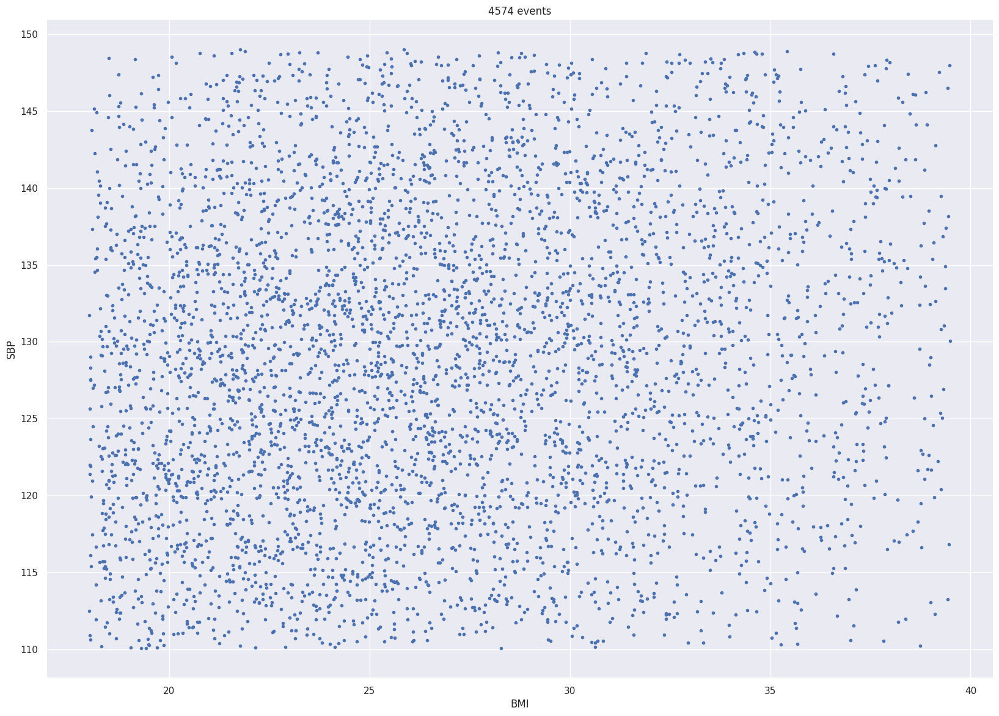

In [ ]:
plt.figure(figsize=(20,14))
plt.plot(D1_train.loc[D1_train['event'] == 1, 'BMI'], D1_train.loc[D1_train['event'] == 1, 'SBP'], '.')
plt.title(str(np.sum(D1_train.event)) + ' events')
plt.xlabel('BMI')
plt.ylabel('SBP')
plt.show()

A simple "model" that calculates empirical probabilities/risk in a given granularity can also be helpful:

In [ ]:
n = 10
counts, xbins, ybins = np.histogram2d(D1_train.BMI, D1_train.SBP, bins=(n, n))
sums, _, _ = np.histogram2d(D1_train.BMI, D1_train.SBP, weights=D1_train.event, bins=(xbins, ybins))
fig = go.Figure(data=[go.Surface(z=sums/counts/mu_ref, x=np.arange(0, 1, 1/n), y=np.arange(0, 1, 1/n))])
fig.update_traces(contours_z=dict(show=True, project_z=True), colorscale='Jet')
fig.update_layout(scene_aspectratio=dict(x=1, y=1, z=1), scene = dict(xaxis_title='Scaled SBP', yaxis_title='Scaled BMI', zaxis_title='Empirical 10 year relative CVD incidence risk'), width=1000, height=1000)
fig.show()

We conclude that dataset $D_1$ is not sufficiently rich to make neural networks (or any other ML model) outperform traditional models.

We thus construct a **more complex dataset** $D_2$ with
* more covariates, 10 instead of 2,
* more events, more than 300k instead of only around 5k,
* non-(logit/log)-linear marginals,
* non-additive interactions of covariates.

For $D_2$, we move from CVD as one of the main causes of death to total **mortality** as target variable and consider a wider age range from 0 to 84.

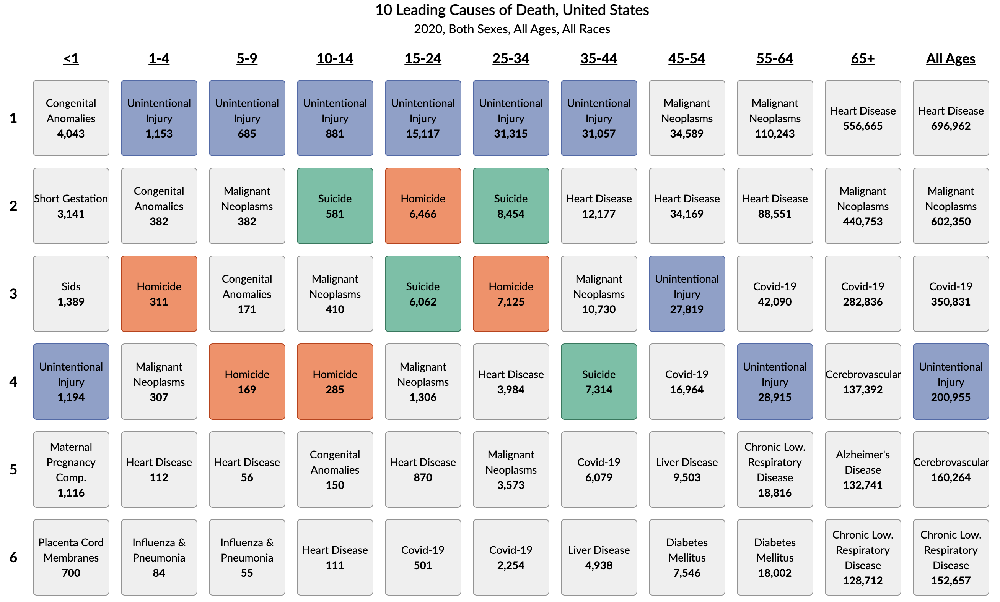

Source: https://wisqars.cdc.gov/data/lcd/home

See also https://www.causesofdeath.org/

Since QRISK3 is only defined for ages from 25 to 84, and since QRISK3 would tend to $-\infty$ for age to 0, we made the following adjustment for ages below 25

`age = np.maximum(age, 25 - 10*np.tanh((25 - age)/10))` ,

which bends the age curve as follows:

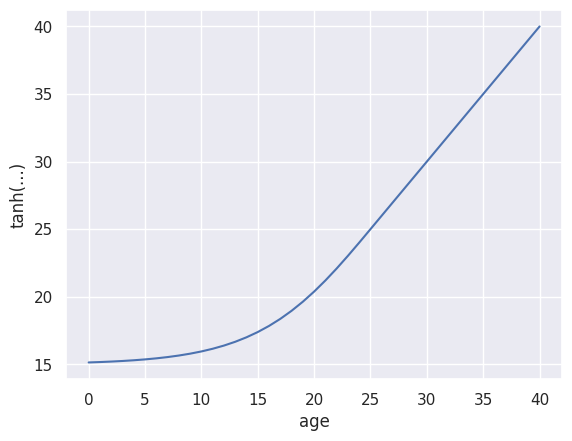

In [ ]:
plt.plot(np.arange(0,41), np.maximum(np.arange(0,41), 25 - 10*np.tanh((25 - np.arange(0,41))/10)))
plt.xlabel('age')
plt.ylabel('tanh(...)')
plt.show()

We take annual mortality rates $q_x$ of Swiss males in year 2019 from the Human Mortality Database, https://mortality.org:

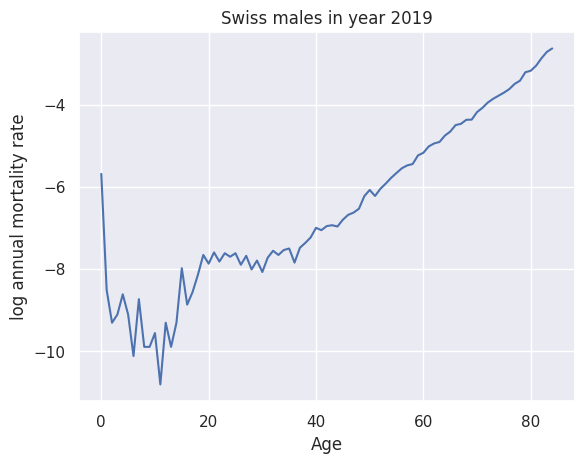

In [ ]:
qx = np.array([3.3900e-03,2.0000e-04,9.0000e-05,1.1000e-04,1.8000e-04,1.1000e-04, 4.0000e-05,1.6000e-04,5.0000e-05,5.0000e-05,7.0000e-05,2.0000e-05,
 9.0000e-05,5.0000e-05,9.0000e-05,3.4000e-04,1.4000e-04,1.9000e-04, 2.9000e-04,4.7000e-04,3.8000e-04,5.0000e-04,4.0000e-04,4.9000e-04,
 4.5000e-04,4.9000e-04,3.7000e-04,4.6000e-04,3.3000e-04,4.1000e-04, 3.1000e-04,4.4000e-04,5.2000e-04,4.7000e-04,5.3000e-04,5.5000e-04,
 3.9000e-04,5.6000e-04,6.3000e-04,7.2000e-04,9.1000e-04,8.6000e-04, 9.5000e-04,9.7000e-04,9.4000e-04,1.1100e-03,1.2500e-03,1.3200e-03,
 1.4500e-03,1.9700e-03,2.2900e-03,1.9800e-03,2.3600e-03,2.6800e-03, 3.0800e-03,3.4700e-03,3.8900e-03,4.1700e-03,4.3100e-03,5.3200e-03,
 5.6700e-03,6.6200e-03,7.1200e-03,7.3800e-03,8.6100e-03,9.5000e-03, 1.1140e-02,1.1490e-02,1.2670e-02,1.2730e-02,1.5300e-02,1.6960e-02,
 1.9290e-02,2.1150e-02,2.2790e-02,2.4540e-02,2.6770e-02,3.0400e-02, 3.2880e-02,4.0410e-02,4.1910e-02,4.7380e-02,5.6770e-02,6.6290e-02,
 7.2150e-02,8.2240e-02,9.6120e-02,1.0834e-01,1.2484e-01,1.3984e-01, 1.5434e-01,1.7482e-01,1.9335e-01,2.1427e-01,2.2078e-01,2.6159e-01,
 2.8584e-01,3.1061e-01,3.3564e-01,3.6064e-01,3.8533e-01,4.0946e-01, 4.3277e-01,4.5506e-01,4.7616e-01,4.9595e-01,5.1433e-01,5.3128e-01, 5.4679e-01,5.6087e-01])
age_range_ext = np.arange(0, 85)
plt.plot(age_range_ext, np.log(qx[age_range_ext]))
plt.xlabel('Age')
plt.ylabel('log annual mortality rate')
plt.title('Swiss males in year 2019')
plt.show()

Calculating 10-year mortality rates $_{10}q_x$:

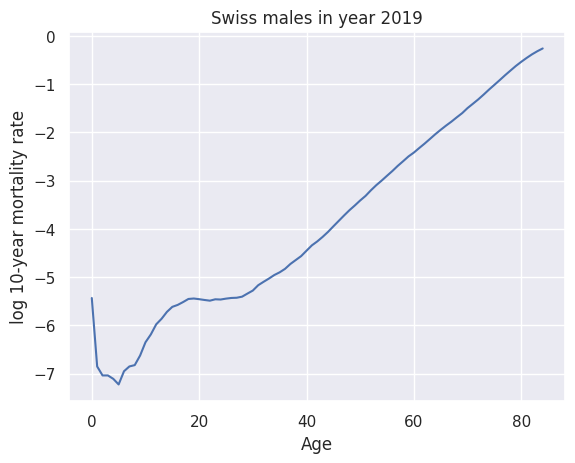

In [ ]:
qx10 = 1 - np.prod(1-np.lib.stride_tricks.sliding_window_view(qx, 10), axis = 1)
plt.plot(age_range_ext, np.log(qx10[age_range_ext]))
plt.xlabel('Age')
plt.ylabel('log 10-year mortality rate')
plt.title('Swiss males in year 2019')
plt.show()

We fit a polynomial of degree 14 to the difference between log QRISK3 and log 10-year mortality.

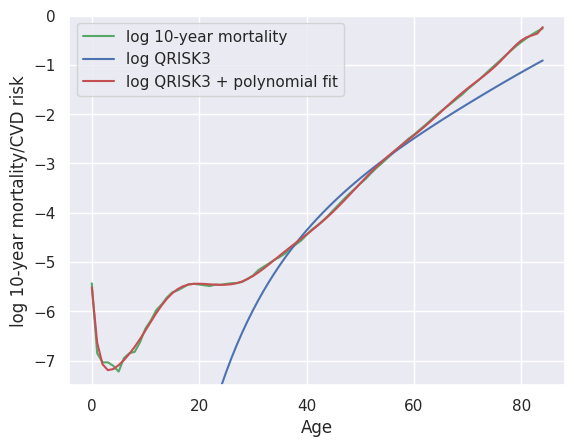

In [ ]:
qrisk = qrisk3(age_range_ext, gender, height, weight, tcl_hdl_ratio, sbp, sd_sbp)
plt.plot(age_range_ext, np.log(qx10[age_range_ext]), 'g')
plt.plot(age_range_ext, np.log(qrisk[age_range_ext]), 'b')
plt.ylim(-7.5, 0)
polyfit = np.polyfit(age_range_ext, np.log(qx10[age_range_ext])-np.log(qrisk), 14)
residual = np.poly1d(polyfit)
plt.plot(age_range_ext, residual(age_range_ext) + np.log(qrisk), 'r')
plt.xlabel('Age')
plt.ylabel('log 10-year mortality/CVD risk')
plt.legend(['log 10-year mortality', 'log QRISK3', 'log QRISK3 + polynomial fit'])
plt.show()

Finally, we extend QRISK3 to mortality by defining:

In [ ]:
def qrisk3_ext(age, gender, height, weight, tcl_hdl_ratio, sbp, sd_sbp, num1, num2, num3, binary):
  q = np.exp(np.log(qrisk3(age, gender, height, weight, tcl_hdl_ratio, sbp, sd_sbp)) + residual(age)
  + 16*(num1-0.5)**4 + 4*(num2-0.5)**2*num3 + num3 + binary - 1.65)
  return np.maximum(0.0001, np.minimum(q, 1))

We define several more ranges, including those for 3 abstract, continuous variables `num1, num2, num3`, e.g., stepcounts, triglycerids, resting heartrate, etc. Also, we introduce another binary variable called `binary`.

In [ ]:
tcl_hdl_ratio_range = np.arange(2.5, 7.5, 0.5)
sd_sbp_range = np.arange(5, 15.5, 0.5)
num1_range = np.arange(0, 1.05, 0.05)
num2_range = np.arange(0, 1.05, 0.05)
num3_range = np.arange(0, 1.05, 0.05)

Let's simulate the second dataset $D_2$. Apart from the same dependency between BMI and SBP of dataset $D_1$, we use another non-trivial dependency between `binary` and `num3`:

`D2.BINARY = np.round((D2.NUM3 + 3*np.random.uniform(low=0, high=1, size=persons))/4)`

Number of events:        144773
Number of individuals:   1376395
Number of person years:  12959172


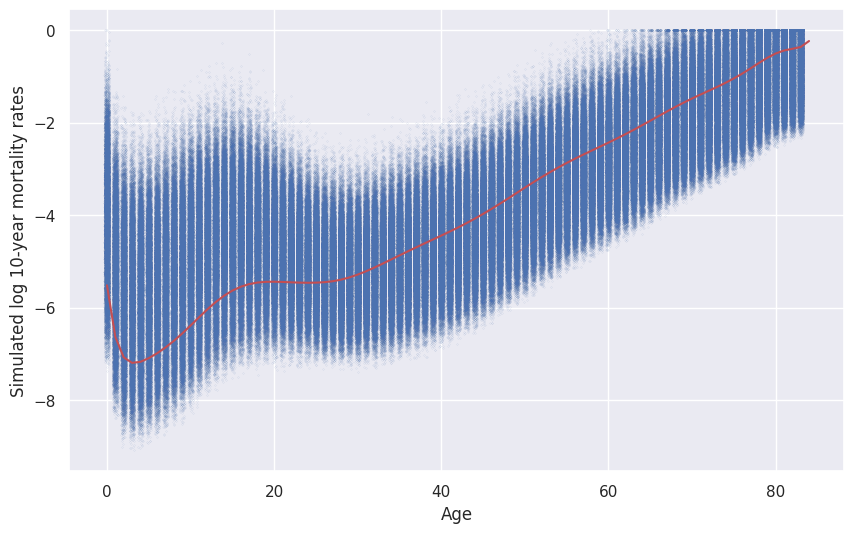

In [ ]:
persons = 2000000
D2 = pd.DataFrame(index = range(persons), columns = ['AGE', 'GENDER', 'BMI', 'SBP', 'TCL_HDL_RATIO', 'SD_SBP', 'NUM1', 'NUM2', 'NUM3', 'BINARY', 'mu', 'T', 'event'])
np.random.seed(0)
sbp_bmi = np.random.multivariate_normal([125, 3.2], np.matmul(np.matmul(np.diag([15, 0.25]), np.array([[1, 0.25], [0.25, 1]])), np.diag([15, 0.25])), size=persons)
D2.SBP = sbp_bmi[:,0]
D2.BMI = np.exp(sbp_bmi[:,1])
D2.AGE = np.random.uniform(low=0, high=84, size=persons).astype(int)
D2.GENDER = np.random.binomial(1, 0.5, size=persons)
D2.TCL_HDL_RATIO = np.random.uniform(low=min(tcl_hdl_ratio_range), high=max(tcl_hdl_ratio_range), size=persons)
D2.SD_SBP = np.random.uniform(low=min(sd_sbp_range), high=max(sd_sbp_range), size=persons)
D2.NUM1 = np.random.uniform(low=0, high=1, size=persons)
D2.NUM2 = np.random.uniform(low=0, high=1, size=persons)
D2.NUM3 = np.random.uniform(low=0, high=1, size=persons)
D2.BINARY = np.round((D2.NUM3 + 3*np.random.uniform(low=0, high=1, size=persons))/4)
q_male = qrisk3_ext(D2.AGE, "male", height, np.exp(sbp_bmi[:,1])*(height/100)**2, D2.TCL_HDL_RATIO, sbp_bmi[:,0], D2.SD_SBP, D2.NUM1, D2.NUM2, D2.NUM3, D2.BINARY)
D2.mu = qrisk3_ext(D2.AGE, "female", height, np.exp(sbp_bmi[:,1])*(height/100)**2, D2.TCL_HDL_RATIO, sbp_bmi[:,0], D2.SD_SBP, D2.NUM1, D2.NUM2, D2.NUM3, D2.BINARY)
D2.loc[D2.GENDER == 0, "mu"] = q_male[D2.GENDER == 0]
D2.event = np.where(np.random.uniform(0, 1, persons) < D2.mu, 1, 0)
D2["T"] = D2.apply(lambda row : max_T if row.event == 0 else draw_T(row.mu), axis=1)
D2 = D2[(D2.SBP>=min(sbp_range)) & (D2.SBP<=max(sbp_range)) & (D2.BMI>=min(bmi_range)) & (D2.BMI<=max(bmi_range))].reset_index()

print("Number of events:       ", np.sum(D2.event))
print("Number of individuals:  ", len(D2))
print("Number of person years: ", int(np.sum(D2["T"])))

# min-max scaling covariates
D2['BMI_scaled'] = (D2.BMI-min(bmi_range))/(max(bmi_range)-min(bmi_range))
D2['SBP_scaled'] = (D2.SBP-min(sbp_range))/(max(sbp_range)-min(sbp_range))
D2['SD_SBP_scaled'] = (D2.SD_SBP-min(sd_sbp_range))/(max(sd_sbp_range)-min(sd_sbp_range))
D2['TCL_HDL_RATIO_scaled'] = (D2.TCL_HDL_RATIO-min(tcl_hdl_ratio_range))/(max(tcl_hdl_ratio_range)-min(tcl_hdl_ratio_range))
D2_train, D2_test = train_test_split(D2, test_size = 0.15, random_state = 0)
D2_train.head()

plt.figure(figsize=(10,6))
plt.plot(D2.AGE + np.random.uniform(-0.3, 0.3, len(D2)), np.log(D2.mu), 'b.', markersize=0.1)
plt.plot(age_range_ext, residual(age_range_ext) + np.log(qrisk), 'r')
plt.xlabel('Age')
plt.ylabel('Simulated log 10-year mortality rates')
plt.show()

## Logistic regression on $D_2$

As a reference baseline for ROC AUC we sort $D_{2, \mathrm{test}}$ by age - 6 times gender.


In [ ]:
age_gender = D2_test.copy()
age_gender["AGE_GENDER"] = age_gender.AGE - age_gender.GENDER*6
age_gender = age_gender.sort_values(by=["AGE_GENDER"]).reset_index()
print("ROC AUC of sorting by age and gender: ", roc_auc_score(age_gender.event, age_gender.index.tolist()))

ROC AUC of sorting by age and gender:  0.8781611144733502


Optimization terminated successfully.
         Current function value: 0.207599
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                  event   No. Observations:              1169935
Model:                          Logit   Df Residuals:                  1169923
Method:                           MLE   Df Model:                           11
Date:                Wed, 21 Jun 2023   Pseudo R-squ.:                  0.3830
Time:                        17:39:55   Log-Likelihood:            -2.4288e+05
converged:                       True   LL-Null:                   -3.9362e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept              -10.0956      0.030   -337.084      0.000     -10.154     -10.037

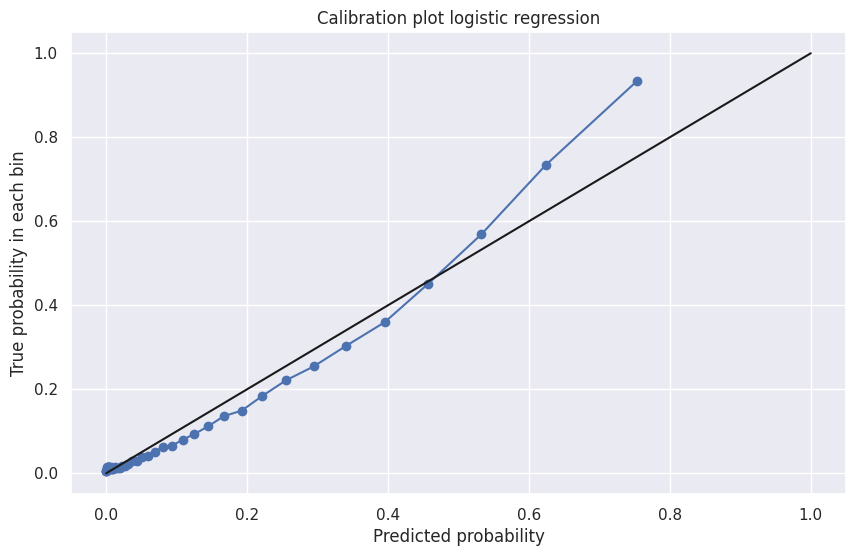

In [ ]:
lin_formula = "AGE + GENDER + SBP_scaled + BMI_scaled + I(BMI_scaled**2) + SD_SBP_scaled + TCL_HDL_RATIO_scaled + NUM1 + NUM2 + NUM3 + BINARY"
log_reg_D2 = sm.logit(formula='event ~ ' + lin_formula, data=D2_train).fit()
print(log_reg_D2.summary())

pred = log_reg_D2.predict(D2_test)
auc_log_reg_D2 = roc_auc_score(D2_test.event, pred)
mse_log_reg_D2 = np.mean(np.square(np.log(D2_test.mu) - np.log(pred)))
dev_log_reg_D2 = -2*np.sum(D2_test.event*logit(pred) + np.log(1-pred))

print("ROC AUC (test):           ", auc_log_reg_D2)
print("MSE wrt log ground truth: ", mse_log_reg_D2)
print("Logistic deviance:        ", dev_log_reg_D2)

prob_true, prob_pred = calibration_curve(D2_test.event, pred,  n_bins=50, strategy='quantile')
plt.figure(figsize=(10,6))
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0, 1], [0, 1], 'k')
plt.title('Calibration plot logistic regression')
plt.xlabel('Predicted probability')
plt.ylabel('True probability in each bin')
plt.show()

## Cox regression on $D_2$

<lifelines.CoxPHFitter: fitted with 1.16994e+06 total observations, 1.04681e+06 right-censored observations>
             duration col = 'T'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 1.16994e+06
number of events observed = 123123
   partial log-likelihood = -1548453.70
         time fit was run = 2023-06-21 17:39:56 UTC

---
                       coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                    
AGE                    0.10       1.10       0.00             0.10             0.10                 1.10                 1.10
GENDER                -0.37       0.69       0.01            -0.38            -0.36                 0.68                 0.70
SBP_scaled             0.35       1.42       0.01             0.33             0.37                 1.39                 1.45
BMI_scaled            -0.42       0.66       0.04            -0.50            -0.34                 0.61                 0.71
I(BMI_scaled**2)       0.46       1.58       0.05             0.37             0.55                 1.44                 1.73
SD_SBP_scaled          0.09       1.09       0.01             0.07             0.11                 1.07                 1.11
TCL_HDL_RATIO_scaled   0.83       2.30       0.01             0.81             0.85                 2.25                 2.34
NUM1                  -0.01       0.99       0.01            -0.03             0.01                 0.97                 1.01
NUM2                   0.00       1.00       0.01            -0.02             0.02                 0.98                 1.02
NUM3                   1.79       6.00       0.01             1.77             1.81                 5.87                 6.12
BINARY                 1.28       3.60       0.01             1.27             1.29                 3.55                 3.65

                       cmp to      z      p   -log2(p)
covariate                                             
AGE                      0.00 373.91 <0.005        inf
GENDER                   0.00 -64.63 <0.005        inf
SBP_scaled               0.00  31.02 <0.005     699.23
BMI_scaled               0.00  -9.94 <0.005      74.89
I(BMI_scaled**2)         0.00   9.90 <0.005      74.30
SD_SBP_scaled            0.00   9.00 <0.005      61.98
TCL_HDL_RATIO_scaled     0.00  83.20 <0.005        inf
NUM1                     0.00  -1.36   0.17       2.53
NUM2                     0.00   0.09   0.93       0.10
NUM3                     0.00 167.09 <0.005        inf
BINARY                   0.00 194.75 <0.005        inf
---
Concordance = 0.89
Partial AIC = 3096929.41
log-likelihood ratio test = 330317.33 on 11 df
-log2(p) of ll-ratio test = inf

ROC AUC (test):            0.9055297903483172
MSE wrt log ground truth:  1.7546013426946472
Logistic deviance:         83994.21928553453


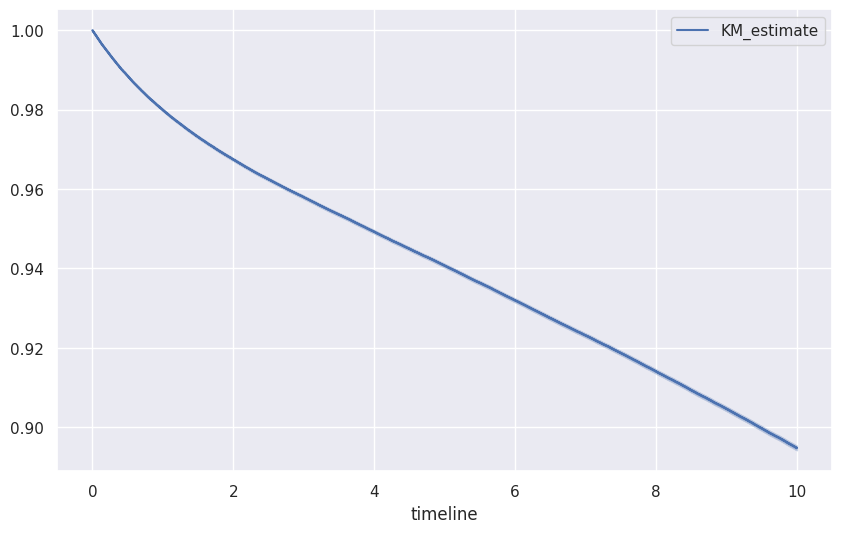

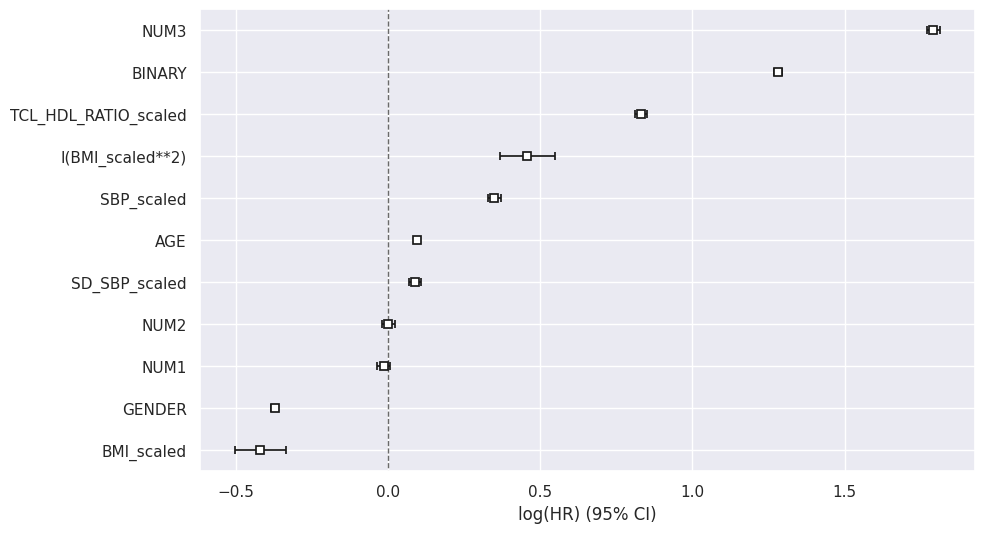

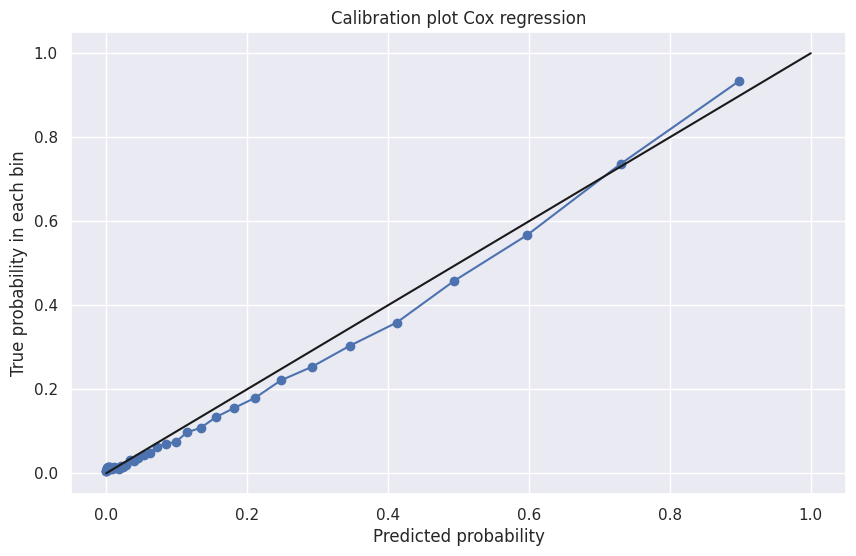

In [ ]:
plt.figure(figsize=(10,6))
kmf = ll.KaplanMeierFitter()
kmf.fit(D2_train['T'], event_observed=D2_train.event)
kmf.plot_survival_function()

plt.figure(figsize=(10,6))
cph_D2 = ll.CoxPHFitter()
cph_D2.fit(D2_train, 'T', event_col='event', formula=lin_formula)
cph_D2.print_summary()
cph_D2.plot()

survival = cph_D2.predict_survival_function(D2_test)
pred = 1 - np.squeeze(np.array(survival.iloc[-1,:]))
auc_cox_reg_D2 = roc_auc_score(D2_test.event, pred)
mse_cox_reg_D2 = np.mean(np.square(np.log(D2_test.mu) - np.log(pred)))
dev_cox_reg_D2 = -2*np.sum(D2_test.event*logit(pred) + np.log(1-pred))

print("ROC AUC (test):           ", auc_cox_reg_D2)
print("MSE wrt log ground truth: ", mse_cox_reg_D2)
print("Logistic deviance:        ", dev_cox_reg_D2)

prob_true, prob_pred = calibration_curve(D2_test.event, pred, n_bins=50, strategy='quantile')
plt.figure(figsize=(10,6))
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0, 1], [0, 1], 'k')
plt.title('Calibration plot Cox regression')
plt.xlabel('Predicted probability')
plt.ylabel('True probability in each bin')
plt.show()

## Neural network on $D_2$

Epoch 1/300
58/58 [==============================] - 9s 143ms/step - loss: 0.4408 - val_loss: 0.2765
Epoch 2/300
58/58 [==============================] - 7s 121ms/step - loss: 0.2643 - val_loss: 0.2472
Epoch 3/300
58/58 [==============================] - 8s 137ms/step - loss: 0.2425 - val_loss: 0.2235
Epoch 4/300
58/58 [==============================] - 7s 120ms/step - loss: 0.2379 - val_loss: 0.2472
Epoch 5/300
58/58 [==============================] - 8s 139ms/step - loss: 0.2199 - val_loss: 0.2042
Epoch 6/300
58/58 [==============================] - 8s 141ms/step - loss: 0.2059 - val_loss: 0.2071
Epoch 7/300
58/58 [==============================] - 7s 119ms/step - loss: 0.2056 - val_loss: 0.2032
Epoch 8/300
58/58 [==============================] - 8s 137ms/step - loss: 0.2165 - val_loss: 0.2103
Epoch 9/300
58/58 [==============================] - 7s 123ms/step - loss: 0.2027 - val_loss: 0.1961
Epoch 10/300
58/58 [==============================] - 8s 134ms/step - loss: 0.2070 - val_lo

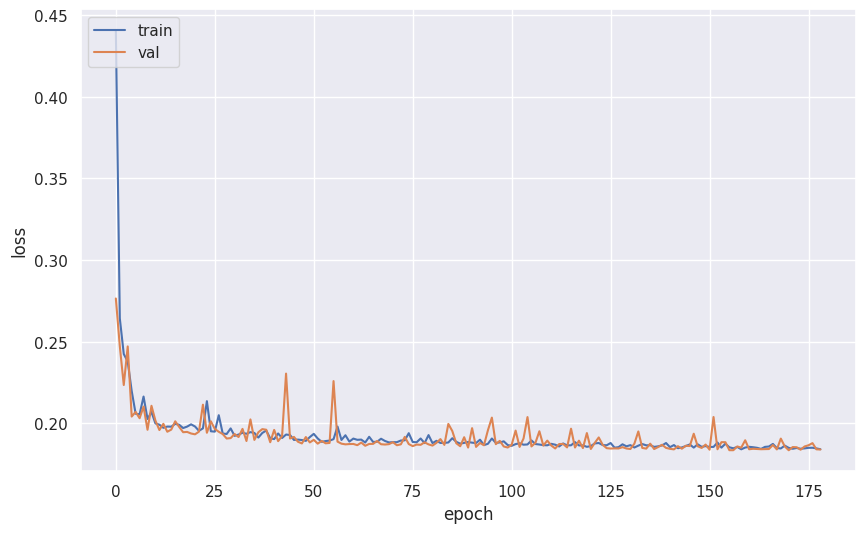

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 256)               2816      
                                                                 
 activation_2 (Activation)   (None, 256)               0         
                                                                 
 dense_5 (Dense)             (None, 128)               32896     
                                                                 
 activation_3 (Activation)   (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 activation_4 (Activation)   (None, 64)                0         
                                                                 
 dense_7 (Dense)             (None, 1)                

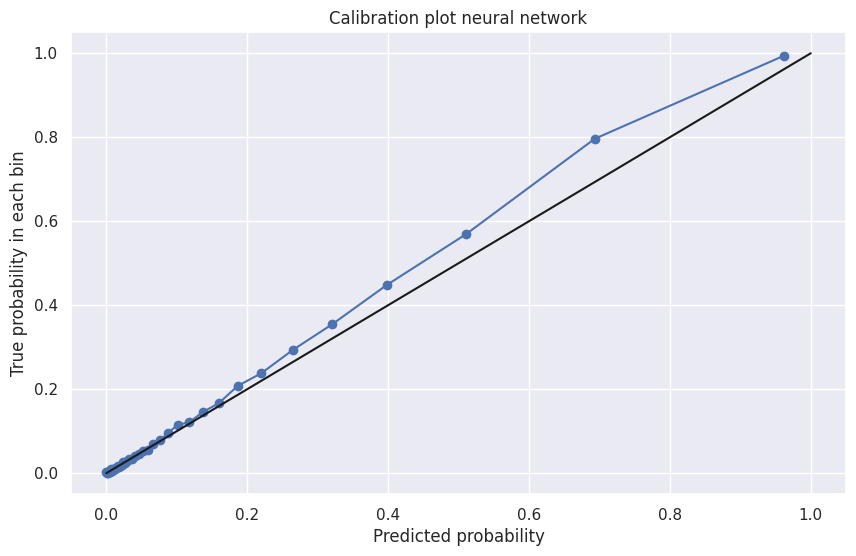

In [ ]:
xvars = ['AGE', 'GENDER', 'SBP_scaled', 'BMI_scaled', 'TCL_HDL_RATIO_scaled', 'SD_SBP_scaled', 'NUM1', 'NUM2', 'NUM3', 'BINARY']

X_train = D2_train[xvars]
y_train = D2_train.event

neural_net_D2 = Sequential([
  Input(shape=(10,)),
  Dense(256, kernel_initializer=tf.keras.initializers.glorot_uniform(seed=0)),
  Activation(tf.keras.activations.relu),
  Dense(128, kernel_initializer=tf.keras.initializers.glorot_uniform(seed=0)),
  Activation(tf.keras.activations.relu),
  Dense(64, kernel_initializer=tf.keras.initializers.glorot_uniform(seed=0)),
  Activation(tf.keras.activations.relu),
  Dense(1, activation = "sigmoid", kernel_initializer=tf.keras.initializers.glorot_uniform(seed=0))
])

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(0.001, decay_steps=1000, decay_rate=0.99)
opt = tf.keras.optimizers.Adam(learning_rate = lr_schedule)
neural_net_D2.compile(optimizer = opt, loss = 'binary_crossentropy')
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience = 20, restore_best_weights=True)

history = neural_net_D2.fit(
  X_train,
  y_train,
  batch_size=16384,
  epochs=300,
  shuffle=True,
  validation_split=0.20,
  verbose=1,
  callbacks=[callback]
)

plt.figure(figsize=(10,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
print(neural_net_D2.summary())

X_test = D2_test[xvars]
y_test = D2_test.event
pred = neural_net_D2.predict(X_test).flatten()
auc_neural_net_D2 = roc_auc_score(D2_test.event, pred)
mse_neural_net_D2 = np.mean(np.square(np.log(D2_test.mu) - np.log(pred)))
dev_neural_net_D2 = -2*np.sum(D2_test.event*logit(pred) + np.log(1-pred))

print("ROC AUC (test):           ", auc_neural_net_D2)
print("MSE wrt log ground truth: ", mse_neural_net_D2)
print("Logistic deviance:        ", dev_neural_net_D2)

prob_true, prob_pred = calibration_curve(D2_test.event, pred, n_bins=50, strategy='quantile')
plt.figure(figsize=(10,6))
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0, 1], [0, 1], 'k')
plt.title('Calibration plot neural network')
plt.xlabel('Predicted probability')
plt.ylabel('True probability in each bin')
plt.show()

Overview of model performance on $D_{2, \mathrm{test}}$.

In [ ]:
print("Logistic regression")
print("===================")
print("ROC AUC (test):           ", auc_log_reg_D2)
print("MSE wrt log ground truth: ", mse_log_reg_D2)
print("Logistic deviance:        ", dev_log_reg_D2)

print("\nCox regression")
print("==============")
print("ROC AUC (test):           ", auc_cox_reg_D2)
print("MSE wrt log ground truth: ", mse_cox_reg_D2)
print("Logistic deviance:        ", dev_cox_reg_D2)

print("\nNeural net")
print("==================")
print("ROC AUC (test):           ", auc_neural_net_D2)
print("MSE wrt log ground truth: ", mse_neural_net_D2)
print("Logistic deviance:        ", dev_neural_net_D2)

Logistic regression
ROC AUC (test):            0.9054449129641041
MSE wrt log ground truth:  1.7381452376691418
Logistic deviance:         85382.84694950932

Cox regression
ROC AUC (test):            0.9055297903483172
MSE wrt log ground truth:  1.7546013426946472
Logistic deviance:         83994.21928553453

Neural net
ROC AUC (test):            0.9196023202407615
MSE wrt log ground truth:  0.2506979520056955
Logistic deviance:         76783.20916142709


# Part 4: Model explainability

From classic statistical modeling, we are used to study the "interior" of a model by looking at estimated model coefficients:

- Their **size** give an impression on **variable importance**.
- Their **value** describe feature **effects** on the prediction.

**XAI** (eXplainable AI) is a collection of methods to study such aspects for any model, e.g., a neural network or a logistic regression.

## Steps towards **responsible** modeling:

1. Understand data structure
2. Use proper validation strategy
3. Understand model (XAI)

Important even when no one asks for them! (Why?)

Examples?

## Basic XAI workflow

1. Study performance -> Insights?
2. Study variable importance -> Insights?
3. Study effects -> Insights?

Aspects 2 and 3 via:

- sklearn.inspect: https://scikit-learn.org/stable/inspection.html
- SHAP: https://github.com/slundberg/shap
- dalex: https://github.com/ModelOriented/DALEX

For simplicity, we ignore the Cox model here.

### Step 1: Performance (revisited)

- How much better is black-box over linear model? -> How much non-linear/interactions are missing in linear model.
- Train versus Test -> Optimism/Overfitting

In [ ]:
# Show train and test AUC for log reg and nn
print("Logistic regression")
print("-Test AUC", roc_auc_score(y_test, log_reg_D2.predict(X_test)))
print("-Train AUC", roc_auc_score(y_train, log_reg_D2.predict(X_train)))

print("\nNeural net")
print("-Test AUC", roc_auc_score(y_test, neural_net_D2.predict(X_test, batch_size=100_000, verbose=False)))
print("-Train AUC", roc_auc_score(y_train, neural_net_D2.predict(X_train, batch_size=100_000, verbose=False)))

Logistic regression
-Test AUC 0.9054449129641041
-Train AUC 0.9047912732610746

Neural net
-Test AUC 0.9196023196159391
-Train AUC 0.9206088525297007


Comments:

- Optimism seems unproblematic for both models.
- The neural net performs substantially better.

### Step 2: Variable importance

Besides *model specific* measures of variable importance (?), also *model agnostic* measures exist, particularly:

**Permutation Variable Importance** of $j$-th feature and data $D$:

1. Calculate model performance $S$ on data $D$, usually (subset of) test data.
2. Shuffle $j$-th column and recalculate performance $\rightarrow S_j$.
3. The larger $S_j - S$, the more important the feature.

Variants?

#### Illustration regarding 1 - AUC

In [ ]:
log_reg_explainer = dx.Explainer(
  log_reg_D2,
  data=X_test,
  y=y_test,
  predict_function=lambda m, X: np.array(m.predict(X)),
  verbose=False,
)

log_reg_explainer.model_parts(
  loss_function='1-auc', N=10000, B=1, type="difference"
).plot(title="Logistic regression")


#### Neural net

In [ ]:
def neural_net_predict(m, X):
  return np.squeeze(np.array(m.predict(X, batch_size=100_000, verbose=False)))

neural_net_explainer = dx.Explainer(
    neural_net_D2,
    data=X_test,
    y=y_test,
    predict_function=neural_net_predict,
    verbose=False,
)

neural_net_explainer.model_parts(
  loss_function='1-auc', N = 10000, B=1, type="difference"
).plot(title="Logistic regression")

Comments:

- Age is the most important predictor, which makes sense. Shuffling its column would reduce AUC by a whopping 0.35.
- Most important predictors are quite similar between models.

### Step 3: Effects

In logistic regression (without interactions), we can read off the effect of $j$-th feature from the fitted coefficients $\hat \beta_j$:

"A 1-unit increase in $x_j$ is associated with a change in the log odds by $\hat \beta_j$, keeping everything else fixed (Ceteris Paribus)."

For a black-box, due to complex interactions, this effect varies from observation to observation.

#### Individual conditional expectations (ICE)

What can we say about (Ceteris Paribus) effect of $j$-th feature?

1. Let's pick single observation!
2. Set its value of $j$-th feature to a value $v_1$ and calculate the prediction.
3. Repeat for grid of values $v_1, \dots, v_m$ and plot predictions against these values.
3. Repeat for many observations.

Working on "link" space (here logit) usually better (why?)

#### Partial dependence plots (PDP)

- Average over many ICE.
- Info on interaction effects is lost.
- Friedman (2001): http://www.jstor.org/stable/2699986.

**Ceteris Paribus is curse and blessing (why?)**


In [ ]:
vars = ["AGE", "GENDER"]

def logit(x):
  return np.log(x / (1 - x))

def neural_net_predict_logit(m, X):
  return logit(neural_net_predict(m, X))

log_reg_explainer_logit = dx.Explainer(
    log_reg_D2,
    data=X_test,
    y=y_test,
    predict_function=lambda m, X: logit(np.array(m.predict(X))),
    verbose=False,
)

neural_net_explainer_logit = dx.Explainer(
    neural_net_D2,
    data=X_test,
    y=y_test,
    predict_function=neural_net_predict_logit,
    verbose=False,
)

log_reg_explainer_logit.model_profile(
  variables=vars, N=100, grid_points=49, verbose=False,
).plot(geom="profiles", title="Logistic regression (log-odds scale)")

neural_net_explainer_logit.model_profile(
  variables=vars, N=100, grid_points=49, verbose=False,
).plot(geom="profiles", title="Neural net (log-odds scale)")

Comments:

- Age effect on log-odds quite non-linear -> should invest more parameters in logistic regression
- ICE curves all parallel in logistic regression -> we did not model interactions
- ICE curves slightly non-parallel in neural net -> interactions

Same on probability scale

In [ ]:
log_reg_explainer.model_profile(
  variables=vars, N=100, grid_points=49, verbose=False,
).plot(geom="profiles", title="Logistic regression (probability scale)")

neural_net_explainer.model_profile(
  variables=vars, N=100, grid_points=49, verbose=False,
).plot(geom="profiles", title="Neural net (probability scale)")

# Appendix

Min mu: 0.0425556834090877
Max mu: 0.7999682505642577
Optimization terminated successfully.
         Current function value: 0.485683
         Iterations 6
ROC AUC (logistic regression):  0.7950670012181861
MSE wrt log ground truth:       0.006851017416402263
Logistic deviance:              97136.5662034237
-------------------------------
ROC AUC (Cox):                  0.7950670012181861
MSE wrt log ground truth:       0.0013924184638465845
Logistic deviance:              96976.72993050618


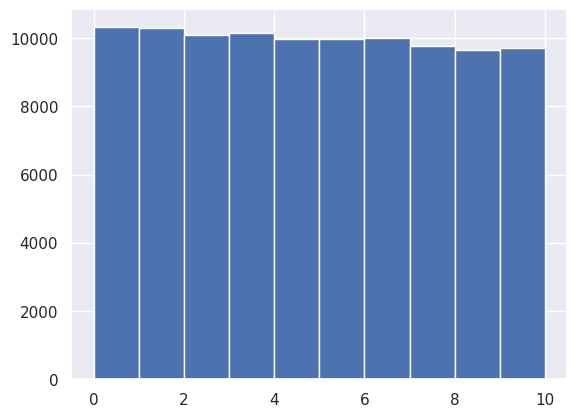

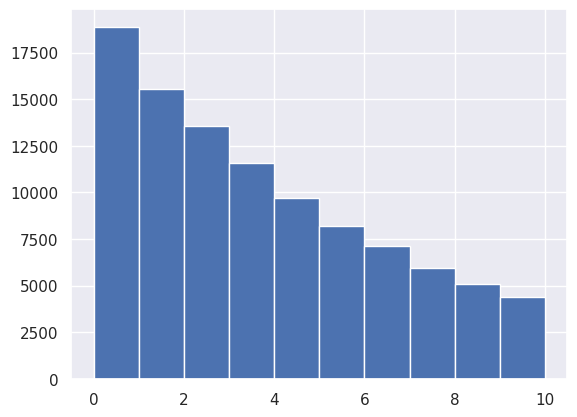

In [ ]:
# Logistic regression vs Cox regression
def draw_T_flat(mu):
  alpha = -np.log(1-mu)/max_T
  t_lb = 0
  t_ub = max_T
  r = np.random.uniform(0, 1)
  # inversion of 1 - survival curve by bisection
  while (t_ub - t_lb > 0.01):
    if (1 - np.exp(-(t_ub + t_lb)/2*alpha))/mu < r:
      t_lb = (t_ub + t_lb)/2
    else:
      t_ub = (t_ub + t_lb)/2
  return (t_ub + t_lb)/2

persons = 100000
D3 = pd.DataFrame(index = range(persons), columns = ['X', 'mu', 'T', 'event'])
np.random.seed(0)
D3.X = np.random.uniform(0, 1, persons)
# use event probabilities between around 0.04 and 0.8
#D3.mu = 0.04*np.exp(3*D3.X) # favors Cox regression
D3.mu = 1.6/(1+np.exp(-3.6*(D3.X-1))) # favors logistic regression
print("Min mu:", np.min(D3.mu))
print("Max mu:", np.max(D3.mu))
D3.event = np.where(np.random.uniform(0, 1, persons) < D3.mu, 1, 0)
D3["T"] = np.round(D3.apply(lambda row : 10 if row.event == 0 else draw_T_flat(row.mu), axis=1))

log_reg = sm.logit(formula='event ~ X', data=D3).fit()
pred = log_reg.predict(D3)
print("ROC AUC (logistic regression): ", roc_auc_score(D3.event, pred))
print("MSE wrt log ground truth:      ", np.mean(np.square(np.log(D3.mu) - np.log(pred))))
print("Logistic deviance:             ", -2*np.sum(D3.event*logit(pred) + np.log(1-pred)))
print("-------------------------------")

cph = ll.CoxPHFitter()
cph.fit(D3, 'T', event_col='event', formula="X")
survival = cph.predict_survival_function(D3)
pred = (1 - np.array(survival)[survival.shape[0]-1,:])
print("ROC AUC (Cox):                 ", roc_auc_score(D3.event, pred))
print("MSE wrt log ground truth:      ", np.mean(np.square(np.log(D3.mu) - np.log(pred))))
print("Logistic deviance:             ", -2*np.sum(D3.event*logit(pred) + np.log(1-pred)))

plt.hist([draw_T_flat(0.04) for x in range(100000)] , bins=10)
plt.show()
plt.hist([draw_T_flat(0.8) for x in range(100000)] , bins=10)
plt.show()

In [ ]:
# Excursus: discrimation-free insurance pricing
#
# consider 4 groups from X_test for best estimate and non-discriminatory prices: (num3 < 0.5, binary = 0), (num3 >= 0.5, binary = 0), (num3 < 0.5, binary = 1), (num3 >= 0.5, binary = 1)
# consider num3 < 0.5 and num3 >= 0.5 for unawareness prices
X_test_00 = X_test.loc[(X_test.NUM3 < 0.5) & (X_test.BINARY == 0)]
X_test_01 = X_test.loc[(X_test.NUM3 < 0.5) & (X_test.BINARY == 1)]
X_test_10 = X_test.loc[(X_test.NUM3 >= 0.5) & (X_test.BINARY == 0)]
X_test_11 = X_test.loc[(X_test.NUM3 >= 0.5) & (X_test.BINARY == 1)]

N_00 = len(X_test_00)
N_01 = len(X_test_01)
N_10 = len(X_test_10)
N_11 = len(X_test_11)

P_00 = np.mean(y_test.loc[(X_test.NUM3 < 0.5) & (X_test.BINARY == 0)])
P_01 = np.mean(y_test.loc[(X_test.NUM3 < 0.5) & (X_test.BINARY == 1)])
P_10 = np.mean(y_test.loc[(X_test.NUM3 >= 0.5) & (X_test.BINARY == 0)])
P_11 = np.mean(y_test.loc[(X_test.NUM3 >= 0.5) & (X_test.BINARY == 1)])

P_0 = np.mean(y_test.loc[(X_test.NUM3 < 0.5)])
P_1 = np.mean(y_test.loc[(X_test.NUM3 >= 0.5)])

print("Exposures: ", [N_00, N_01, N_10, N_11])
print("Best estimate prices: ", [P_00, P_01, P_10, P_11])
print("Unawareness prices for NUM3 < 0.5 and NUM3 >= 0.5:        ", [P_0, P_1])
print("Non-discriminatory prices for NUM3 < 0.5 and NUM3 >= 0.5: ", [(P_00*(N_00+N_10)+P_01*(N_01+N_11))/(N_00+N_01+N_10+N_11), (P_10*(N_00+N_10)+P_11*(N_01+N_11))/(N_00+N_01+N_10+N_11)])

Exposures:  [60371, 42947, 42760, 60382]
Best estimate prices:  [0.03929038776896192, 0.10827298763592334, 0.08126753975678204, 0.18470736312146005]
Unawareness prices for NUM3 < 0.5 and NUM3 >= 0.5:         [0.06796492382740665, 0.1418238932733513]
Non-discriminatory prices for NUM3 < 0.5 and NUM3 >= 0.5:  [0.07381476567099261, 0.13303705205189398]
